# Transcriptómica espacial

## Enlaces del tutorial
Explora los siguientes enlaces para iniciarte en el análisis transcriptómico espacial:

* ●	Paquete de herramientas para transcriptomica espacial [semla](https://ludvigla.github.io/semla/articles/getting_started.html). Junto con este tutorial se encuentran otros de los que se deriva gran parte de este notebook, y que abarcan la extracción y el análisis de transcriptómica espacial con el paquete semla.

* [Viñeta Transcriptomica Espacial Seurat](https://satijalab.org/seurat/articles/spatial_vignette.html) ¿ Cómo realizar análisis transcriptómicos espaciales con el paquete Seurat?

## Instalar los paquetes

In [1]:
## Función para ejecutar comandos de terminal en Google Colab con el kernel de R
shell_call <- function(command, ...) {
  result <- system(command, intern = TRUE, ...)  # Ejecuta el comando de terminal y guarda la salida
  cat(paste0(result, collapse = "\n"))  # Imprime la salida en un formato legible
}
# Descarga el código desde la URL especificada y lo guarda como "add_cranapt_jammy.sh"
download.file("https://github.com/eddelbuettel/r2u/raw/master/inst/scripts/add_cranapt_jammy.sh",
              "add_cranapt_jammy.sh")
Sys.chmod("add_cranapt_jammy.sh", "0755")
shell_call("./add_cranapt_jammy.sh")
bspm::enable()
options(bspm.version.check=FALSE)
shell_call("rm add_cranapt_jammy.sh")
# Establece un límite de tiempo más alto para evitar interrupciones durante descargas de paquetes.
options(timeout=1000)

23 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists...
Building dependency tree...
Reading state information...
ca-certificates is already the newest version (20240203~22.04.1).
gnupg is already the newest version (2.2.27-3ubuntu2.5).
gnupg set to manually installed.
wget is already the newest version (1.21.2-2ubuntu1.1).
0 upgraded, 0 newly installed, 0 to remove and 23 not upgraded.
-----BEGIN PGP PUBLIC KEY BLOCK-----

mQINBFM+sY8BEADA70T+U0/2WNjOTLvytuXLvBC4vgA8hYvOaBS1cL3d8lu4mwr4
W84/6p4v/mXle/0eIO2D2g+XfK72ZHZxpS+bb7yPxrkCDLGxwUd/khtTJHSbbKFo
J73AsABflMe+8qv+E74+QTiXErTCNioFRz18sa0EvOnEAiokau6TZVYY2z9YjBNI
yEjTi+z+g8c1RL6VmrFEpTicTpafOLbkRyw0VKnAKG7Ytp3Ksc1G9/IAoKw3Q9La
0DJb5iX6hyB7+PNid6htK4LtPKZ2dNSrnRvNNkjj5BgcM2AT1hmxbzHNzIVmPoKA
CQFrkdjog3/PcyjdtZG7cfoSDXrbIAZeAa2ngLv9C/DJatVDd6maPOe66gLo7+As
ErMvO9vtiouqLdurW+Lhx0jFW9Ca3g1taLfbSDyS3X1mOGWcisbQvBqkIuoDQTeS
V4Z04wrwTZ1HtweKG/s5fmPtZNGWVI5YNRLIwdmbGzFTMPu2XTAOd+xSK2H+46Kh
Sh4kFeP6pBh5No

Tracing function "install.packages" in package "utils"



In [2]:
# Instala el paquete "semla" desde GitHub forzando su actualización.
remotes::install_github("ludvigla/semla", upgrade=T, force = TRUE)

rappdirs     (0.3.3 -> 0.3.4    ) [CRAN]
cpp11        (0.5.2 -> 0.5.3    ) [CRAN]
dotCall64    (NA    -> 1.2      ) [CRAN]
parallelly   (NA    -> 1.46.1   ) [CRAN]
listenv      (NA    -> 0.10.0   ) [CRAN]
globals      (NA    -> 0.18.0   ) [CRAN]
future       (NA    -> 1.69.0   ) [CRAN]
RcppEigen    (NA    -> 0.3.4.0.2) [CRAN]
sitmo        (NA    -> 2.0.2    ) [CRAN]
BH           (NA    -> 1.90.0-1 ) [CRAN]
RcppProgress (NA    -> 0.4.2    ) [CRAN]
dqrng        (NA    -> 0.4.1    ) [CRAN]
RSpectra     (NA    -> 0.16-2   ) [CRAN]
RcppAnnoy    (NA    -> 0.0.23   ) [CRAN]
irlba        (NA    -> 2.3.5.1  ) [CRAN]
FNN          (NA    -> 1.1.4.1  ) [CRAN]
polyclip     (NA    -> 1.10-7   ) [CRAN]
deldir       (NA    -> 2.0-4    ) [CRAN]
spatstat.... (NA    -> 3.2-1    ) [CRAN]
spatstat.... (NA    -> 3.1-6    ) [CRAN]
spatstat.... (NA    -> 3.1-9    ) [CRAN]
tensor       (NA    -> 1.5.1    ) [CRAN]
abind        (NA    -> 1.4-8    ) [CRAN]
goftest      (NA    -> 1.2-3    ) [CRAN]
spatstat.... (NA

Installing 74 packages: rappdirs, cpp11, dotCall64, parallelly, listenv, globals, future, RcppEigen, sitmo, BH, RcppProgress, dqrng, RSpectra, RcppAnnoy, irlba, FNN, polyclip, deldir, spatstat.utils, spatstat.univar, spatstat.data, tensor, abind, goftest, spatstat.sparse, spatstat.random, spatstat.geom, plyr, RcppArmadillo, matrixStats, gridExtra, reshape2, future.apply, bitops, caTools, gtools, gplots, png, here, RcppTOML, xfun, crosstalk, lazyeval, zoo, spam, progressr, sp, uwot, spatstat.explore, sctransform, scattermore, Rtsne, ROCR, reticulate, RcppHNSW, RANN, plotly, pbapply, patchwork, lmtest, igraph, ica, ggridges, ggrepel, fitdistrplus, fastDummies, cowplot, SeuratObject, reactR, shinyjs, dbscan, zeallot, magick, Seurat



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpja25DL/remotes1704080c405/ludvigla-semla-0e4c08e/DESCRIPTION’ ... OK
* preparing ‘semla’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘semla_1.4.0.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [3]:
cranPkgs2Install = c("BiocManager", "ggpubr", "Seurat", "hdf5r", "openxlsx",
                     "enrichR", "clustree", "DT","ggcorrplot","scatterpie", "pheatmap")
install.packages(cranPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)

In [4]:
biocPkgs2Install = c("SingleCellExperiment", "ReactomePA", "org.Hs.eg.db", "glmGamPoi", "fgsea", "limma")
BiocManager::install(biocPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com

Bioconductor version 3.22 (BiocManager 1.30.27), R 4.5.2 (2025-10-31)

Installing package(s) 'BiocVersion', 'SingleCellExperiment', 'ReactomePA',
  'org.Hs.eg.db', 'glmGamPoi', 'fgsea', 'limma'

Old packages: 'uuid', 'xml2'



In [5]:
# Suprime los mensajes al cargar paquetes para mantener la salida limpia.
suppressPackageStartupMessages({
library(Seurat)  # Marco de análisis para RNA-seq de célula única.
library(data.table)  # Manejo eficiente de grandes volúmenes de datos.
library(ggplot2)  # Visualización basada en la gramática de gráficos.
library(plotly)  # Visualizaciones interactivas.
library(RColorBrewer)  # Paletas de colores predefinidas.
library(dplyr)  # Manipulación de datos.
library(semla) # Herramientas para transcriptómica espacial.
library(clustree)  # Visualización de resoluciones de clústeres.
library(ReactomePA)  # Análisis de vías metabólicas.
library(org.Hs.eg.db)  # Base de datos de anotación génica humana.
library(ggpubr)  # Visualizaciones listas para publicación.
library(enrichR)  # Análisis de enriquecimiento génico.
library(stringr)  # Manipulación de cadenas (caracteres).
library(openxlsx)  # Visualizaciones archivos Excel.
library(patchwork)  # Combina múltiples gráficos.
library(SingleCellExperiment)  # Estructura para datos de célula única.
})

## Descargar los datos

Los datos descargados a continuacion corresponden a un dataset de transcriptomica espacial disponible desde la pagina de 10x y generado con [Space Ranger](https://www.10xgenomics.com/support/software/space-ranger/latest), la muestra corresponde a tejido de cancer de mama.
Puedes revisar detalles en los siguientes enlaces:

- [Human Breast Cancer (Block A Section 1)](https://www.10xgenomics.com/datasets/human-breast-cancer-block-a-section-1-1-standard-1-1-0)

- [Human Breast Cancer (Block A Section 2)](https://www.10xgenomics.com/datasets/human-breast-cancer-block-a-section-2-1-standard-1-1-0)

In [6]:
shell_call("mkdir -p ST_Exercises")
# Descarga los archivos que contienen ejercicios de transcriptómica espacial.
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_2/V1_Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5','ST_Exercises/Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_2/V1_Breast_Cancer_Block_A_Section_2_spatial.tar.gz','ST_Exercises/Breast_Cancer_Block_A_Section_2_spatial.tar.gz')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_2/V1_Breast_Cancer_Block_A_Section_2_metrics_summary.csv','ST_Exercises/Breast_Cancer_Block_A_Section_2_metrics_summary.csv')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_2/V1_Breast_Cancer_Block_A_Section_2_web_summary.html','ST_Exercises/Breast_Cancer_Block_A_Section_2_web_summary.html')

download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_1/V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5','ST_Exercises/Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_1/V1_Breast_Cancer_Block_A_Section_1_spatial.tar.gz','ST_Exercises/Breast_Cancer_Block_A_Section_1_spatial.tar.gz')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_1/V1_Breast_Cancer_Block_A_Section_1_metrics_summary.csv','ST_Exercises/Breast_Cancer_Block_A_Section_1_metrics_summary.csv')
download.file('https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Breast_Cancer_Block_A_Section_1/V1_Breast_Cancer_Block_A_Section_1_web_summary.html','ST_Exercises/Breast_Cancer_Block_A_Section_1_web_summary.html')
# Lista los archivos en el directorio actual con tamaños legibles.
shell_call("ls -lh ST_Exercises")

total 90M
-rw-r--r-- 1 root root  27M Jan 23 16:33 Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5
-rw-r--r-- 1 root root  969 Jan 23 16:33 Breast_Cancer_Block_A_Section_1_metrics_summary.csv
-rw-r--r-- 1 root root 9.5M Jan 23 16:33 Breast_Cancer_Block_A_Section_1_spatial.tar.gz
-rw-r--r-- 1 root root 7.7M Jan 23 16:33 Breast_Cancer_Block_A_Section_1_web_summary.html
-rw-r--r-- 1 root root  28M Jan 23 16:33 Breast_Cancer_Block_A_Section_2_filtered_feature_bc_matrix.h5
-rw-r--r-- 1 root root  966 Jan 23 16:33 Breast_Cancer_Block_A_Section_2_metrics_summary.csv
-rw-r--r-- 1 root root 9.9M Jan 23 16:33 Breast_Cancer_Block_A_Section_2_spatial.tar.gz
-rw-r--r-- 1 root root 7.9M Jan 23 16:33 Breast_Cancer_Block_A_Section_2_web_summary.html

In [7]:
shell_call("tar -xvzf ST_Exercises/Breast_Cancer_Block_A_Section_1_spatial.tar.gz -C ST_Exercises/")
shell_call("mv ST_Exercises/spatial ST_Exercises/Spatial_Section_1")
shell_call("tar -xvzf ST_Exercises/Breast_Cancer_Block_A_Section_2_spatial.tar.gz -C ST_Exercises/")
shell_call("mv ST_Exercises/spatial ST_Exercises/Spatial_Section_2")

spatial/
spatial/aligned_fiducials.jpg
spatial/detected_tissue_image.jpg
spatial/tissue_hires_image.png
spatial/tissue_lowres_image.png
spatial/scalefactors_json.json
spatial/tissue_positions_list.csvspatial/
spatial/scalefactors_json.json
spatial/tissue_hires_image.png
spatial/detected_tissue_image.jpg
spatial/tissue_lowres_image.png
spatial/aligned_fiducials.jpg
spatial/tissue_positions_list.csv

## Cargar el conjunto de datos

In [8]:
samples <- list.files(
  path = "/content/ST_Exercises",
  pattern = "filtered_feature_bc_matrix.h5",
  full.names = TRUE,
  recursive = TRUE
)

imgs <- list.files(
  path = "/content/ST_Exercises",
  pattern = "tissue_lowres_image.png",
  full.names = TRUE,
  recursive = TRUE
)

spotfiles <- list.files(
  path = "/content/ST_Exercises",
  pattern = "positions_list.csv",
  full.names = TRUE,
  recursive = TRUE
)

json <- list.files(
  path = "/content/ST_Exercises",
  pattern = "scalefactors_json.json",
  full.names = TRUE,
  recursive = TRUE
)

infoTable <- tibble(samples, imgs, spotfiles, json, # Add required columns
                    sample_id = c("Breast_Cancer_Block_A_Section_1", "Breast_Cancer_Block_A_Section_2")) # Add additional column
dim(infoTable)

[1] 2 5

In [9]:
SpatialData <- ReadVisiumData(infoTable)
SpatialData



── Reading 10x Visium data ──



ℹ Loading matrices:

→   Finished loading expression matrix 1

→   Finished loading expression matrix 2



ℹ Merging expression matrices:

✔ There are 36601 features and 7785 spots in the merged expression matrix.

ℹ Loading coordinates:

→   Finished loading coordinates for sample 1

→   Finished loading coordinates for sample 2

ℹ Collected coordinates for 7785 spots.



── Creating `Seurat` object 

✔ Expression matrices and coordinates are compatible

ℹ Created `Seurat` object

ℹ Created `Staffli` object

✔ Returning a `Seurat` object with 36601 features and 7785 spots



An object of class Seurat 
36601 features across 7785 samples within 1 assay 
Active assay: Spatial (36601 features, 0 variable features)
 1 layer present: counts

In [10]:
# Carga un objeto de Seurat.
#load(file = "ST_Exercises/Exercise1_dataset.RData")
# Obtiene información del conjunto de datos
# Este comando recupera el ensayo por defecto actual del objeto Seurat SpatialData
DefaultAssay(SpatialData)
# Muestra el número de genes (features) y células.
dim(SpatialData)
head(SpatialData@meta.data)
# Este comando genera una tabla de frecuencias de la columna "ids" en los metadatos del objeto Seurat SpatialData.
table(SpatialData@meta.data$sample_id)


[1] "Spatial"

[1] 36601  7785

,orig.ident,nCount_Spatial,nFeature_Spatial,sample_id
,<fct>,<dbl>,<int>,<chr>
AAACAAGTATCTCCCA-1,SeuratProject,12072,4408,Breast_Cancer_Block_A_Section_1
AAACACCAATAACTGC-1,SeuratProject,54083,9001,Breast_Cancer_Block_A_Section_1
AAACAGAGCGACTCCT-1,SeuratProject,4237,2377,Breast_Cancer_Block_A_Section_1
AAACAGGGTCTATATT-1,SeuratProject,22649,5846,Breast_Cancer_Block_A_Section_1
AAACAGTGTTCCTGGG-1,SeuratProject,51367,8691,Breast_Cancer_Block_A_Section_1
AAACATTTCCCGGATT-1,SeuratProject,28157,7240,Breast_Cancer_Block_A_Section_1



Breast_Cancer_Block_A_Section_1 Breast_Cancer_Block_A_Section_2 
                           3798                            3987 

## Gráficos de control de calidad (CC)

Graficar las métricas

Warning message:
“Default search for "data" layer in "Spatial" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“The `fun.y` argument of `stat_summary()` is deprecated as of ggplot2 3.3.0.
ℹ Please use the `fun` argument instead.”


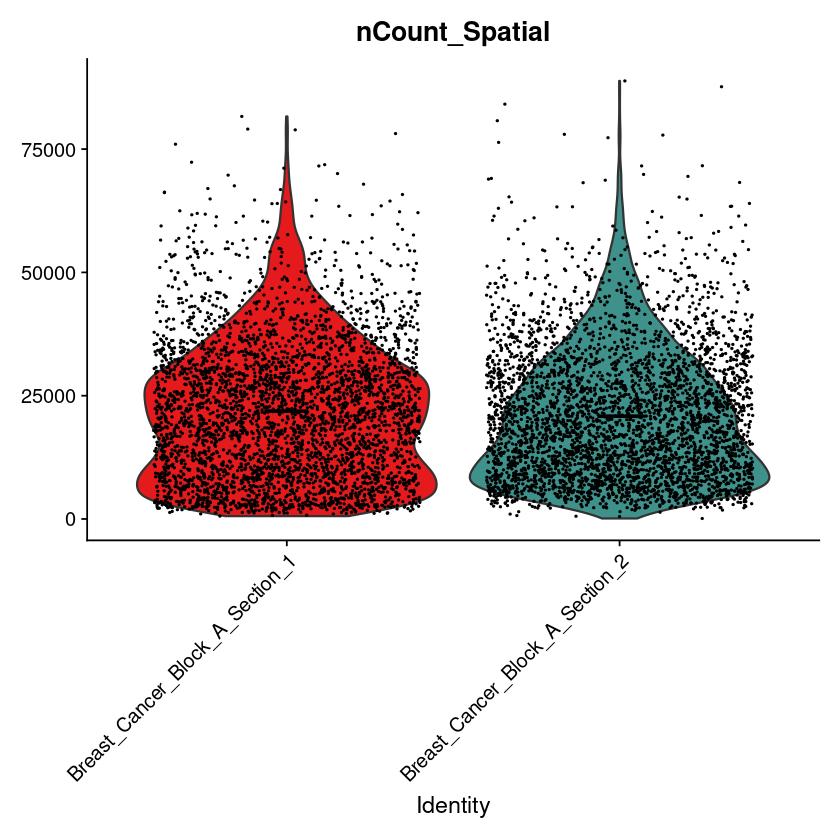

In [11]:
# Crea una función de paleta de colores usando colorRampPalette del paquete grDevices, y colores del esquema "Set1" de RColorBrewer.
getPalette = colorRampPalette(brewer.pal(8, "Set1"))
color = getPalette(6)
VlnPlot(SpatialData, # Genera un violin plot (gráfico de violin)
       features = "nCount_Spatial", # Especifica la característica a graficar
       group.by = "sample_id", # Agrupa los datos según la columna "ids" de los metadatos.
       pt.size = 0.1, # Define el tamaño de los puntos en el gráfico.
       cols = color) + # Define los colores para cada grupo.
  stat_summary(fun.y=mean, geom="point", shape=95, size=15, color = "black") + NoLegend()
  # Agrega una capa al gráfico con la media de la característica representada.

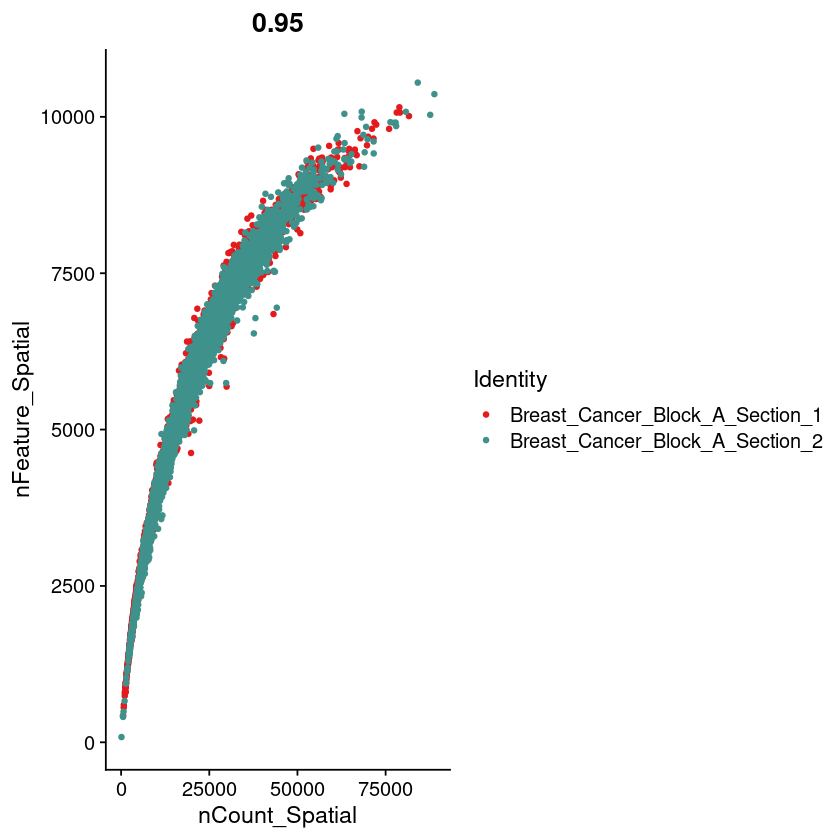

In [12]:
# Gráfico de dispersión que compara la cantidad de ARN con el número de características (genes)
FeatureScatter(object = SpatialData, feature1 = "nCount_Spatial",
feature2 = "nFeature_Spatial", group.by = "sample_id", cols = color)



── Loading H&E images ──



ℹ Loading image from /content/ST_Exercises/Spatial_Section_1/tissue_lowres_image.png

ℹ Scaled image from 600x600 to 400x400 pixels

ℹ Loading image from /content/ST_Exercises/Spatial_Section_2/tissue_lowres_image.png

ℹ Scaled image from 600x600 to 400x400 pixels

ℹ Saving loaded H&E images as 'rasters' in Seurat object



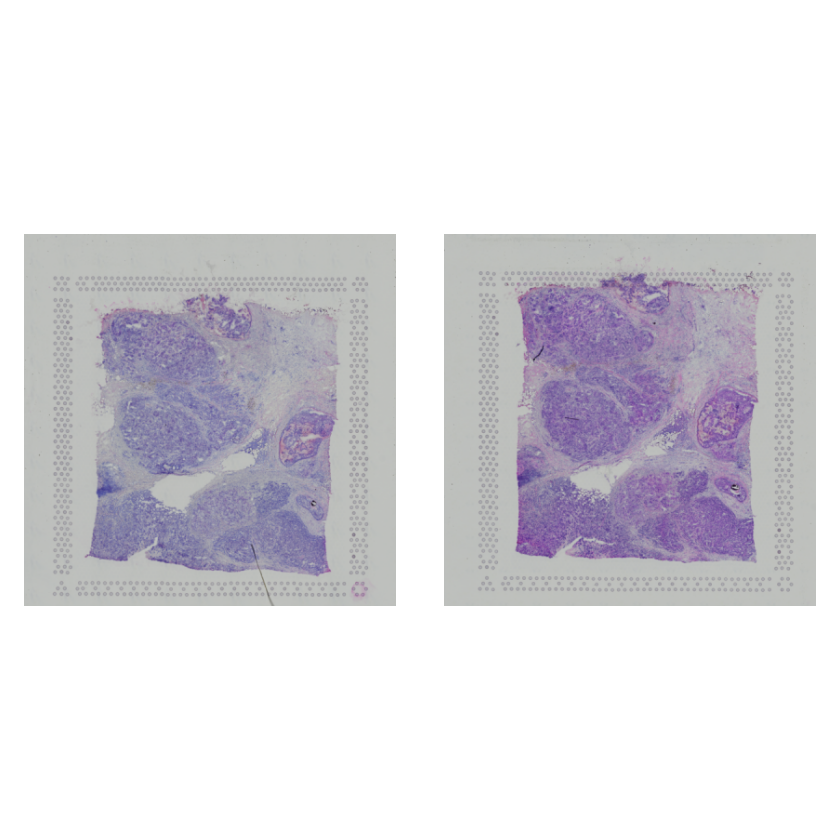

In [13]:
SpatialData <- LoadImages(SpatialData)
ImagePlot(SpatialData)

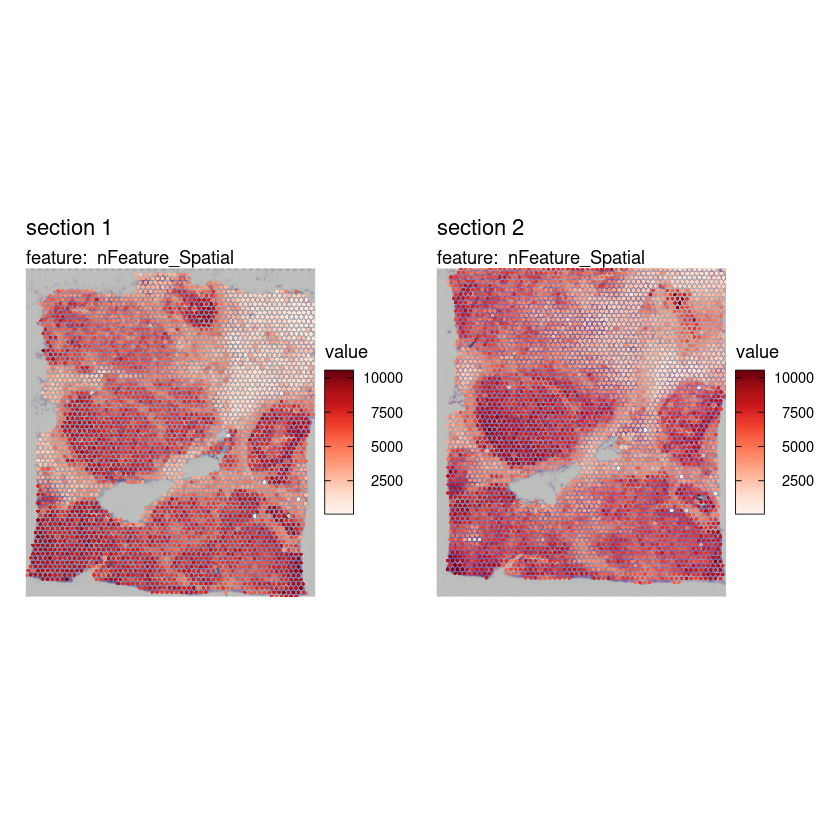

In [14]:
MapFeatures(SpatialData, features = "nFeature_Spatial",
            image_use = "raw", override_plot_dims = TRUE) & ThemeLegendRight()

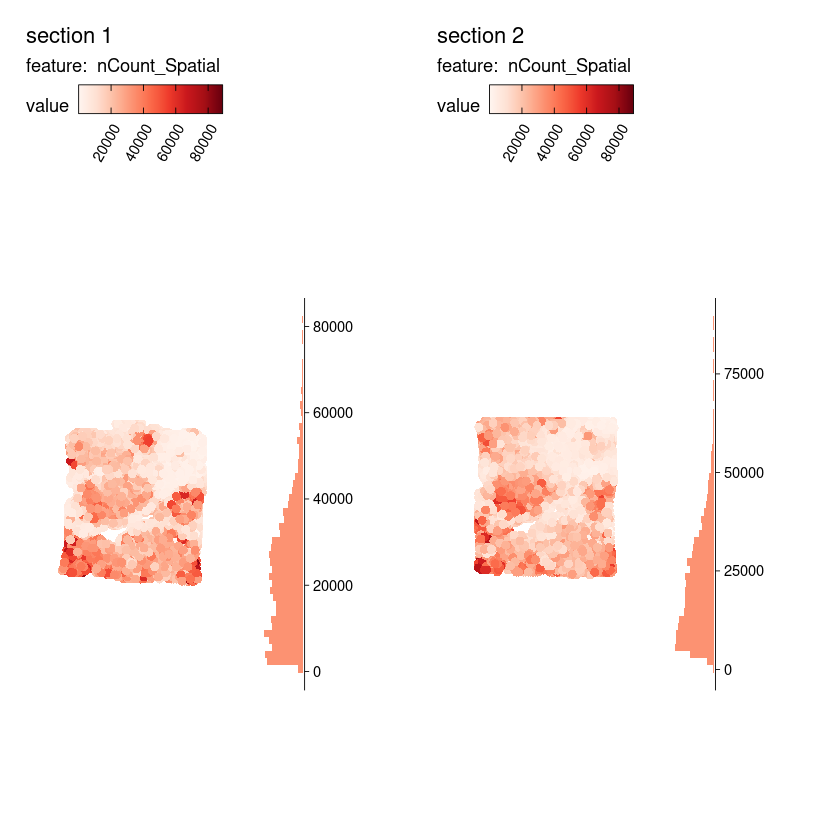

In [15]:
MapFeaturesSummary(
  object = SpatialData,                  # tu objeto semla/Seurat
  features = "nCount_Spatial",   # métrica a mostrar
  pt_size = 2.5,                   # tamaño de los puntos
  ncol = 2,                       # número de columnas en el layout
  subplot_type = "histogram"
)

Alternativa de seurat para graficar datos de transcriptomica espacial

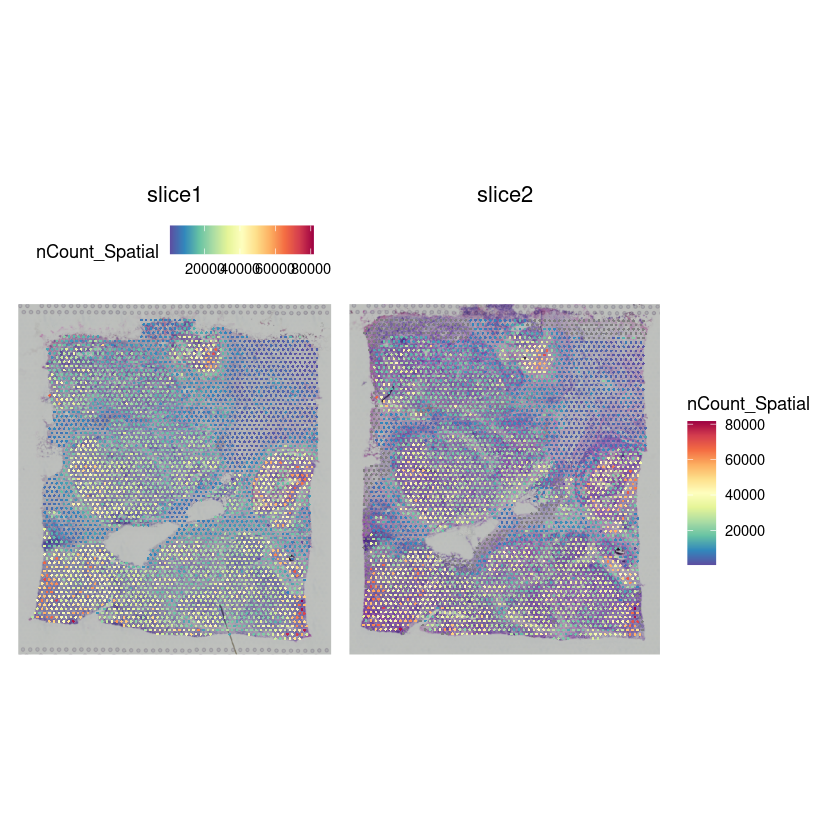

In [16]:
SpatialData2 <- SpatialData
SpatialData2@images[["slice1"]] <- Read10X_Image(dirname(SpatialData2@tools$Staffli@imgs[1]))
SpatialData2@images[["slice2"]] <- Read10X_Image(dirname(SpatialData2@tools$Staffli@imgs[2]))
SpatialFeaturePlot(SpatialData2, features = "nCount_Spatial") + theme(legend.position = "right")
rm(SpatialData2)

## Normalización

La normalización es un paso crucial del preprocesamiento en el análisis de datos de scRNA-seq. Implica ajustar los datos brutos de expresión génica para tener en cuenta las variaciones técnicas y las diferencias en la profundidad de secuenciación entre células. Estas comparaciones deberían ayudar a comprender las fortalezas y debilidades de cada método de normalización.

Método de Normalización

* SCTransform: Un método más avanzado que utiliza la regresión binomial negativa para eliminar la variabilidad técnica y estabilizar la varianza, proporcionando una normalización robusta para datos de una sola célula.

* Normalización Log: Escala los valores de expresión génica y aplica una transformación logarítmica, lo que ayuda a estabilizar la varianza y a que los datos sean más adecuados para el análisis posterior.

Eliminación de la Variabilidad Técnica

* SCTransform: Mayor robustez en la eliminación de la variabilidad técnica, lo que la hace ideal para conjuntos de datos con variación significativa.

* NormalizaciónDatos (NormalizeData): Eficaz, pero menos sofisticado que SCTransform en el manejo de la variabilidad técnica.

Complejidad y Tiempo de Ejecución

* SCTransform: Más complejo y laborioso debido a los cálculos de regresión y la transformación estabilizadora de la varianza.

* NormalizarDatos (NormalizeData): Más simple y rápido, ideal para análisis rápidos y grandes conjuntos de datos.

Manejo de Covariables

* SCTransform: Permite la inclusión de covariables (p. ej., número de genes detectados por célula) para la regresión, lo que mejora la calidad de los datos normalizados.

* NormalizarDatos (NormalizeData): Normalmente no incorpora covariables directamente en el proceso de normalización.

Estabilización de la Varianza

* SCTransform: Estabiliza la varianza, lo que hace que los datos sean más adecuados para análisis posteriores, como la agrupación en clústeres y la identificación de marcadores.

* NormalizarDatos (NormalizeData): Utiliza la transformación logarítmica para estabilizar parcialmente la varianza, pero no con la misma eficacia que SCTransform.

Flexibilidad

* SCTransform: Se centra principalmente en el manejo de datos de secuenciación de ARN de células individuales con métodos de normalización robustos.

* NormalizarDatos (NormalizeData): Flexible con diferentes métodos de normalización (p. ej., LogNormalize), lo que permite ajustes según las necesidades específicas del análisis.

Escalabilidad

* SCTransform: Puede gestionar grandes conjuntos de datos, pero puede ser más lento debido a su complejidad.

* NormalizaciónDatos  (NormalizeData): Gestiona grandes conjuntos de datos de forma eficiente gracias a su simplicidad y velocidad.


In [17]:
# Normalizar datos usando LogNormalize con un factor de escala
SpatialData <- NormalizeData(object = SpatialData, assay = "Spatial")

Normalizing layer: counts



In [18]:
SpatialData <- FindVariableFeatures(SpatialData, nfeatures = 10000)

Finding variable features for layer counts



La siguiente comparacion toma mucho tiempo **se recomienda no correr**

In [19]:
# Normalizar datos usando SCTransform
#SpatialData <- SCTransform(SpatialData, assay = "Spatial", verbose = TRUE, return.only.var.genes = FALSE)
# Comparar métodos de normalización (LogNormalize vs SCTransform)
#SpatialData <- GroupCorrelation(SpatialData, group.assay = "Spatial", assay = "Spatial", layer = "data", do.plot = FALSE)
#SpatialData <- GroupCorrelation(SpatialData, group.assay = "Spatial", assay = "SCT", layer = "scale.data", do.plot = FALSE)

# Generar gráficos de comparación
#p1 <- GroupCorrelationPlot(SpatialData, assay = "Spatial", cor = "nCount_Spatial_cor") + ggtitle("Log Normalization")
#p2 <- GroupCorrelationPlot(SpatialData, assay = "SCT", cor = "nCount_Spatial_cor") + ggtitle("SCTransform Normalization")

# Mostrar ambos gráficos lado a lado
#p1 + p2

## Clusterizacion


In [20]:
devtools::install_github("zdebruine/RcppML")
devtools::install_github("zdebruine/singlet")


── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpja25DL/remotes1703c9b0fbf/zdebruine-RcppML-5449a5b/DESCRIPTION’ ... OK
* preparing ‘RcppML’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
  NB: this package now depends on R (>= 3.5.0)
  serialize/load version 3 cannot be read in older versions of R.
  File(s) containing such objects:
    ‘RcppML/data/aml.rdata’ ‘RcppML/data/hawaiibirds.rdata’
    ‘RcppML/data/movielens.rdata’
* building ‘RcppML_0.5.6.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)




babelgene  (NA -> 22.9  ) [CRAN]
assertthat (NA -> 0.2.1 ) [CRAN]
msigdbr    (NA -> 25.1.1) [CRAN]


Skipping 2 packages not available: fgsea, limma

Installing 3 packages: babelgene, assertthat, msigdbr



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpja25DL/remotes170765b97e1/zdebruine-singlet-7ce199e/DESCRIPTION’ ... OK
* preparing ‘singlet’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
  NB: this package now depends on R (>= 3.5.0)
  serialize/load version 3 cannot be read in older versions of R.
  File(s) containing such objects:
    ‘singlet/data/pbmc3k.RData’
* building ‘singlet_0.99.8.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [21]:
library(singlet)
# Set seed for reproducibility
set.seed(42)
SpatialData2 <- SpatialData
# OPTIONAL: subset data to improve computational speed
SpatialData2 <- SpatialData2[VariableFeatures(SpatialData2), ]
SpatialData2 <- RunNMF(SpatialData2)

Loading required package: RcppML

RcppML v0.5.5 using 'options(RcppML.threads = 0)' (all available threads), 'options(RcppML.verbose = FALSE)'


Attaching package: ‘RcppML’


The following object is masked from ‘package:generics’:

    evaluate


Loading required package: RcppEigen


Attaching package: ‘singlet’


The following object is masked from ‘package:Seurat’:

    ProjectData




running with sparse optimization

REPLICATE  1 / 3 
k = 2 , rep = 1 
   test_error = 4.6144e-02 
   not overfit
   best rank in replicate = 2 

k = 3 , rep = 1 
   test_error = 4.4768e-02 
   not overfit
   best rank in replicate = 3 

k = 6 , rep = 1 
   test_error = 4.3579e-02 
   not overfit
   best rank in replicate = 6 

k = 11 , rep = 1 
   test_error = 4.2607e-02 
   not overfit
   best rank in replicate = 11 

k = 21 , rep = 1 
   test_error = 4.2008e-02 
   not overfit
   best rank in replicate = 21 

k = 39 , rep = 1 
   test_error = 4.2053e-02 
   overfit (overfit_score = 4.9027e-04 )
   best rank in replicate = 21 

k = 30 , rep = 1 
   test_error = 4.1905e-02 
   not overfit
   best rank in replicate = 30 

k = 26 , rep = 1 
   test_error = 4.1925e-02 
   not overfit
   best rank in replicate = 30 

k = 34 , rep = 1 
   test_error = 4.1998e-02 
   overfit (overfit_score = 1.3717e-04 )
   best rank in replicate = 30 

k = 28 , rep = 1 
   test_error = 4.1926e-02 
   not ove

In [22]:
SpatialData@reductions  <- SpatialData2@reductions
rm(SpatialData2)
gc()
k <- ncol(SpatialData@reductions$nmf@feature.loadings)
k

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,11937360,637.6,17813228,951.4,17813228,951.4
Vcells,155314312,1185.0,557049149,4250.0,693786678,5293.2


[1] 23

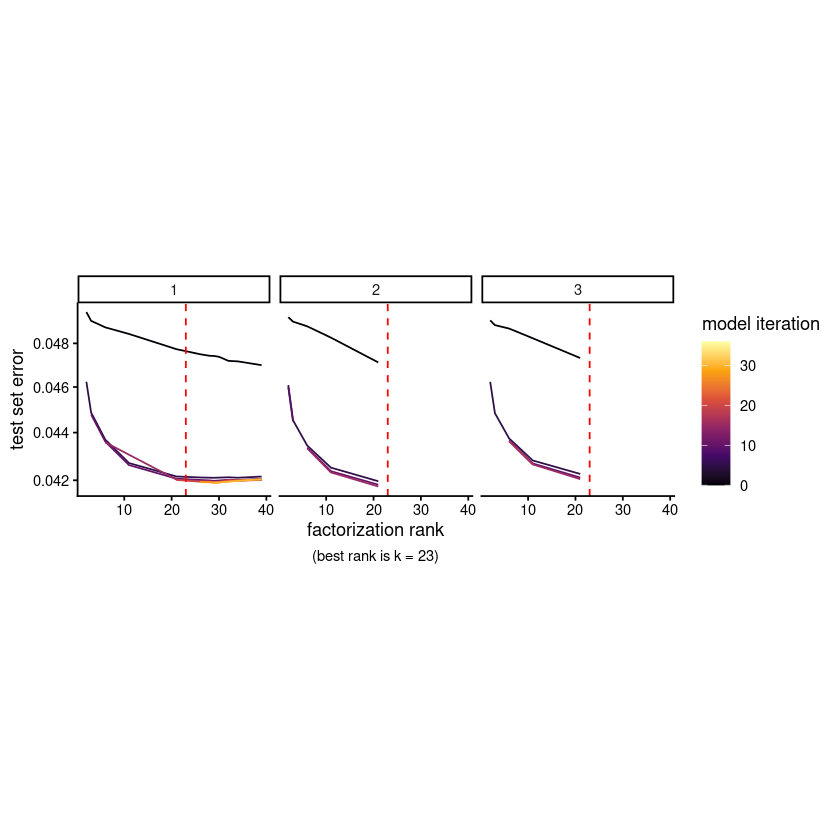

In [23]:
RankPlot(SpatialData)

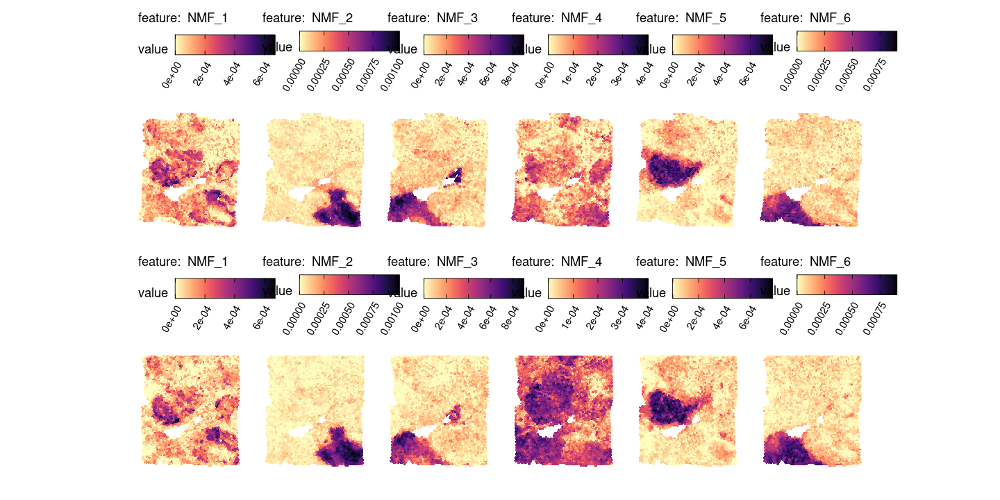

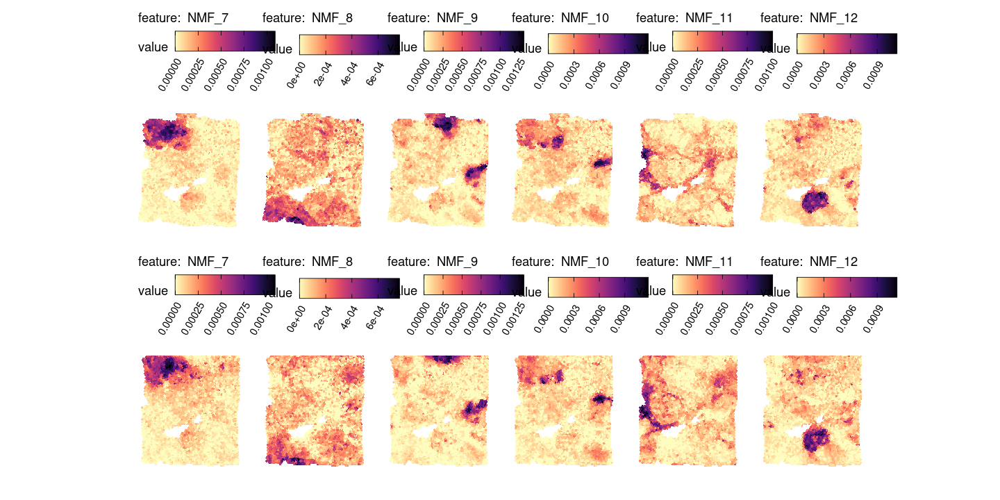

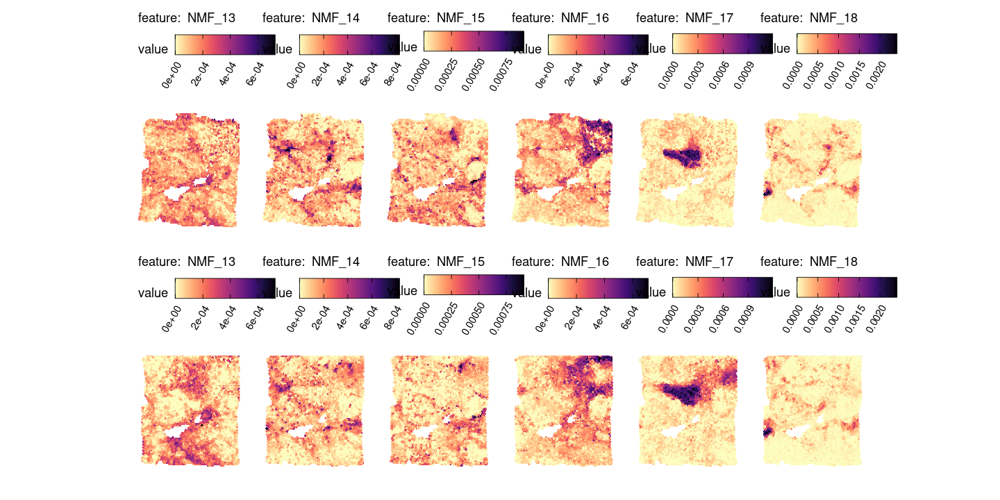

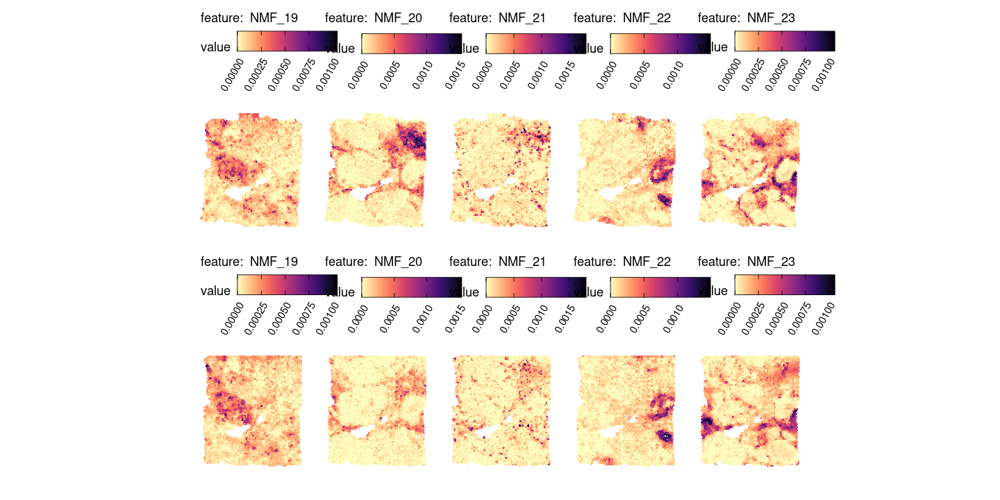

In [24]:
options(repr.plot.width=12, repr.plot.height=6)
MapFeatures(SpatialData,
            features = paste0("NMF_", 1:6),
            override_plot_dims = TRUE,
            colors = viridis::magma(n = 11, direction = -1)) &
  theme(plot.title = element_blank())
MapFeatures(SpatialData,
            features = paste0("NMF_", 7:12),
            override_plot_dims = TRUE,
            colors = viridis::magma(n = 11, direction = -1)) &
  theme(plot.title = element_blank())
  MapFeatures(SpatialData,
            features = paste0("NMF_", 13:18),
            override_plot_dims = TRUE,
            colors = viridis::magma(n = 11, direction = -1)) &
  theme(plot.title = element_blank())
  MapFeatures(SpatialData,
            features = paste0("NMF_", 19:k),
            override_plot_dims = TRUE,
            colors = viridis::magma(n = 11, direction = -1)) &
  theme(plot.title = element_blank())

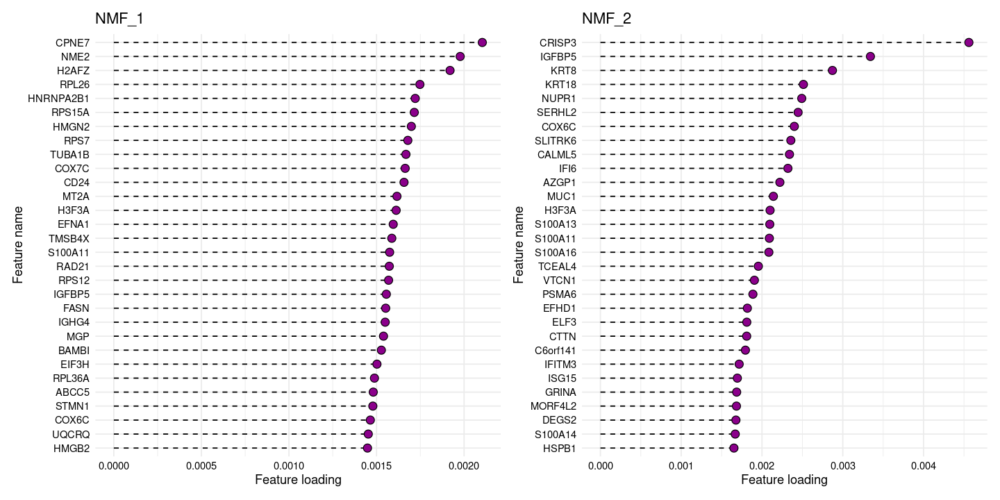

In [25]:
PlotFeatureLoadings(SpatialData,
                    dims = 1:2,
                    reduction = "nmf",
                    nfeatures = 30,
                    mode = "dotplot",
                    fill = "darkmagenta",
                    pt_size = 3)

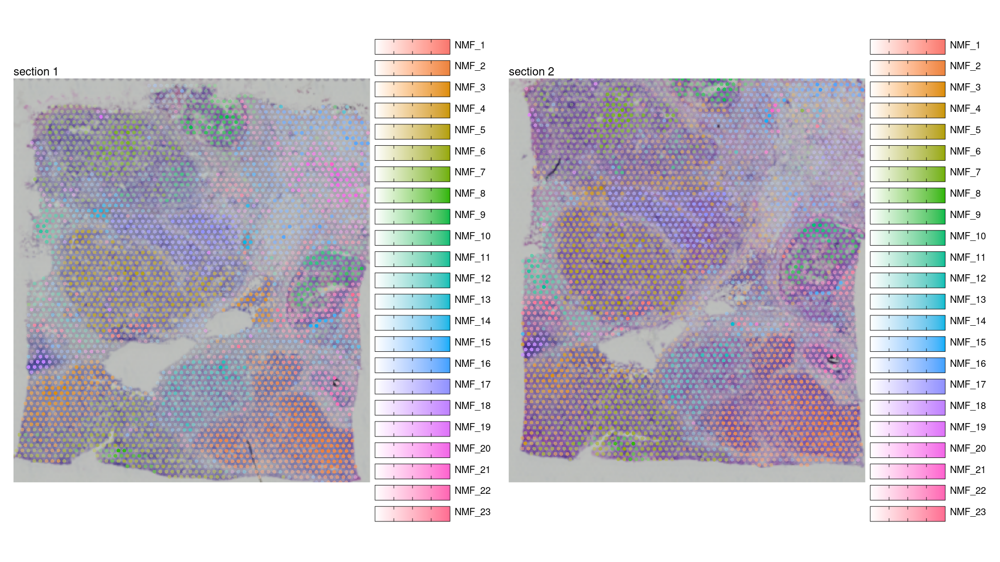

In [26]:
options(repr.plot.width=16, repr.plot.height=9)
MapMultipleFeatures(SpatialData,
                    features = paste0("NMF_", 1:k),
                    image_use = "raw",
                    override_plot_dims = TRUE,
                    pt_size = 2)

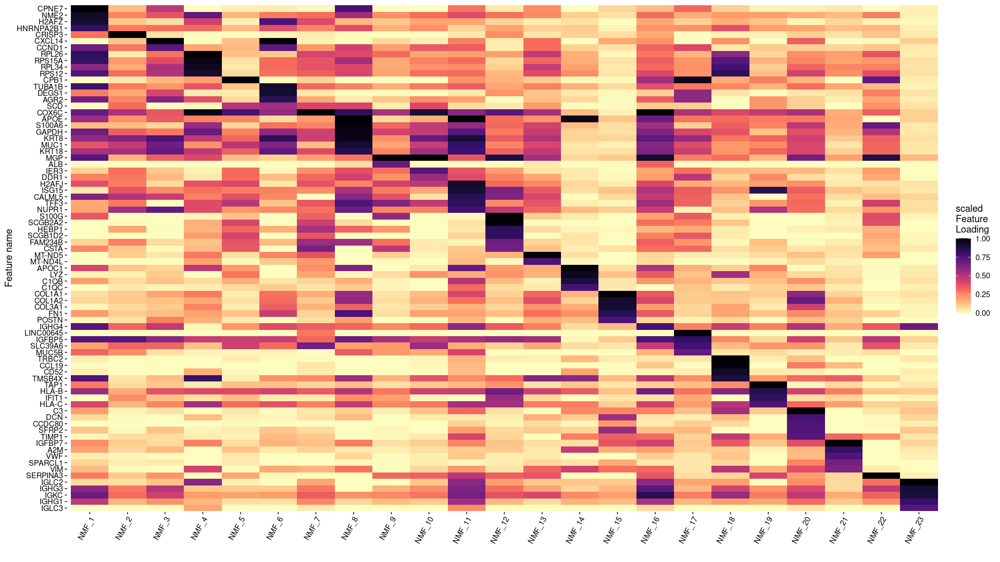

In [27]:
PlotFeatureLoadings(SpatialData,
                    dims = 1:k,
                    reduction = "nmf",
                    nfeatures = 5,
                    mode = "heatmap",
                    gradient_colors = viridis::magma(n = 11, direction = -1))

In [28]:
SpatialData <- RunUMAP(SpatialData, reduction = "nmf", dims = 1:k, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [29]:
# Realiza la agrupación basada en grafos de Seurat
# Encuentra los vecinos más cercanos para cada célula utilizando factorización de matriz no negativa (NMF)
SpatialData <- FindNeighbors(object = SpatialData,
                      dims = 1:k, # Usa las primeras 10 dimensiones del método de reducción especificado
                      reduction = "nmf", # Indica que se utilizó NMF como método de reducción dimensional
                      verbose = FALSE) # Suprime la salida detallada

# Define una secuencia de resoluciones desde 0 hasta 2, con incrementos de 0.1
SpatialData <- FindClusters(SpatialData, resolution = seq(0, 1.2, by = 0.2),
                      verbose = FALSE)

In [30]:
head(SpatialData@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,sample_id,Spatial_snn_res.0,Spatial_snn_res.0.2,Spatial_snn_res.0.4,Spatial_snn_res.0.6,Spatial_snn_res.0.8,Spatial_snn_res.1,Spatial_snn_res.1.2,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACAAGTATCTCCCA-1,SeuratProject,12072,4408,Breast_Cancer_Block_A_Section_1,0,0,4,4,4,5,1,1
AAACACCAATAACTGC-1,SeuratProject,54083,9001,Breast_Cancer_Block_A_Section_1,0,2,1,2,0,0,9,9
AAACAGAGCGACTCCT-1,SeuratProject,4237,2377,Breast_Cancer_Block_A_Section_1,0,0,0,11,3,2,3,3
AAACAGGGTCTATATT-1,SeuratProject,22649,5846,Breast_Cancer_Block_A_Section_1,0,0,4,4,4,5,1,1
AAACAGTGTTCCTGGG-1,SeuratProject,51367,8691,Breast_Cancer_Block_A_Section_1,0,2,1,14,15,16,19,19
AAACATTTCCCGGATT-1,SeuratProject,28157,7240,Breast_Cancer_Block_A_Section_1,0,3,2,1,13,4,2,2


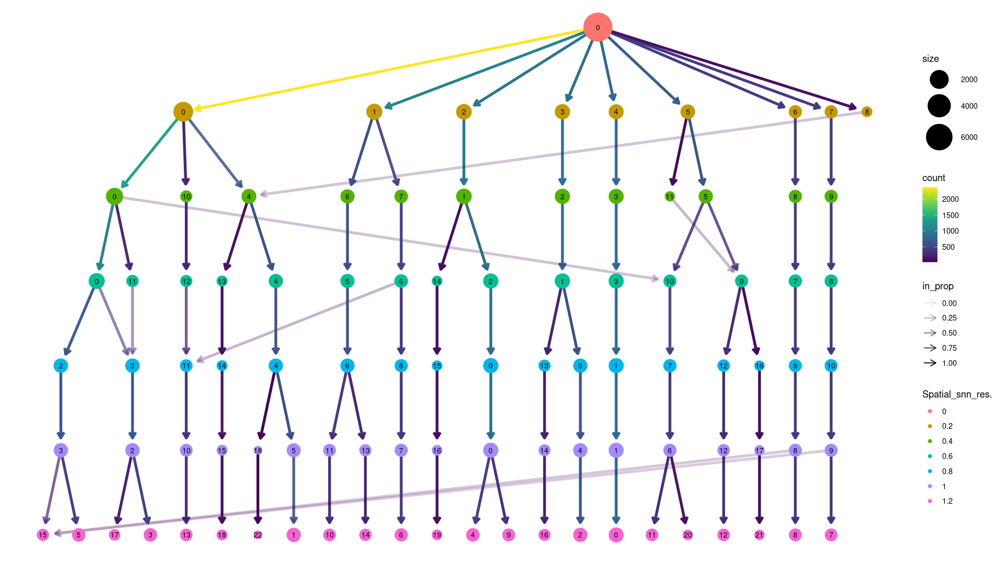

In [31]:
# Visualiza los resultados de agrupamiento a diferentes resoluciones usando Clustree
clustree(SpatialData, prefix = "Spatial_snn_res.")

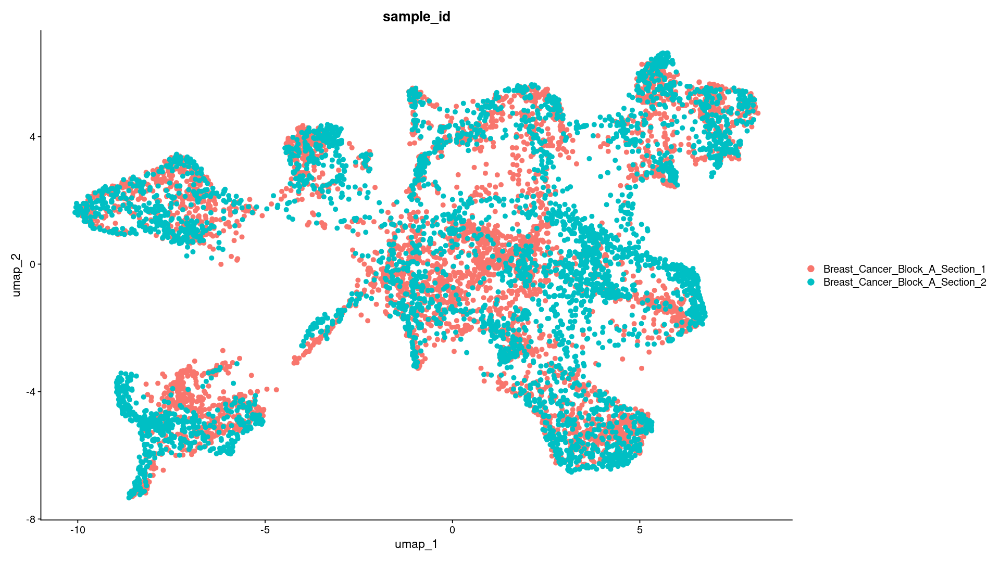

In [32]:
# Crea un gráfico UMAP agrupado por "ids", sin etiquetas de agrupamiento (clúster)
DimPlot(SpatialData, reduction = "umap", label = FALSE, group.by = "sample_id",
        pt.size = 2, label.size=13)

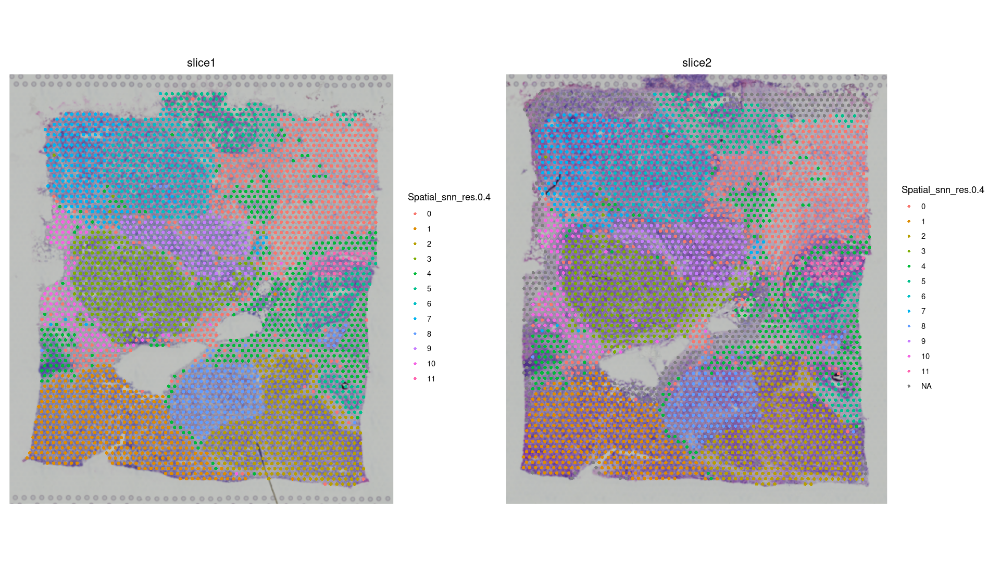

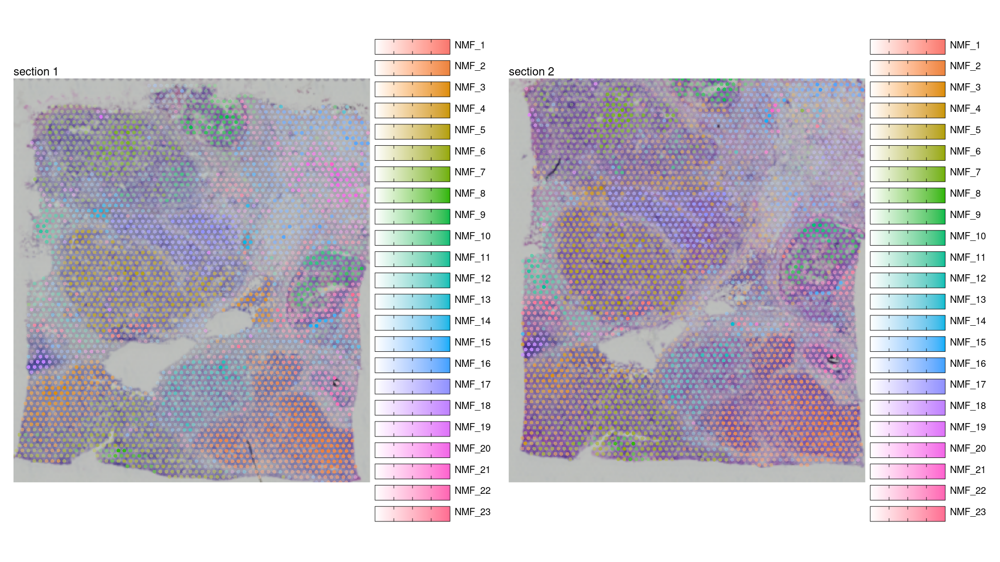

In [33]:
SpatialData2 <- SpatialData
SpatialData2@images[["slice1"]] <- Read10X_Image(dirname(SpatialData2@tools$Staffli@imgs[1]))
SpatialData2@images[["slice2"]] <- Read10X_Image(dirname(SpatialData2@tools$Staffli@imgs[2]))
# Grafica únicamente la lámina 3 del paciente G
# Superpone la expresión de características en coordenadas espaciales
SpatialDimPlot(SpatialData2, group.by = "Spatial_snn_res.0.4") + theme(legend.position = "right")
MapMultipleFeatures(SpatialData2,
                    features = paste0("NMF_", 1:k),
                    image_use = "raw",
                    override_plot_dims = TRUE,
                    pt_size = 2)

In [34]:
# Ejercicio: Guardar la imagen en un archivo

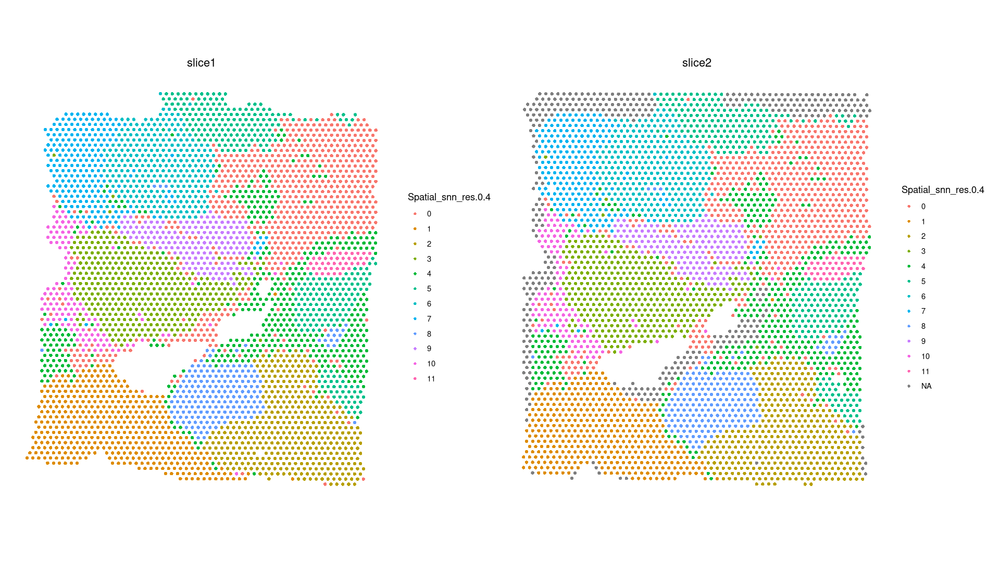

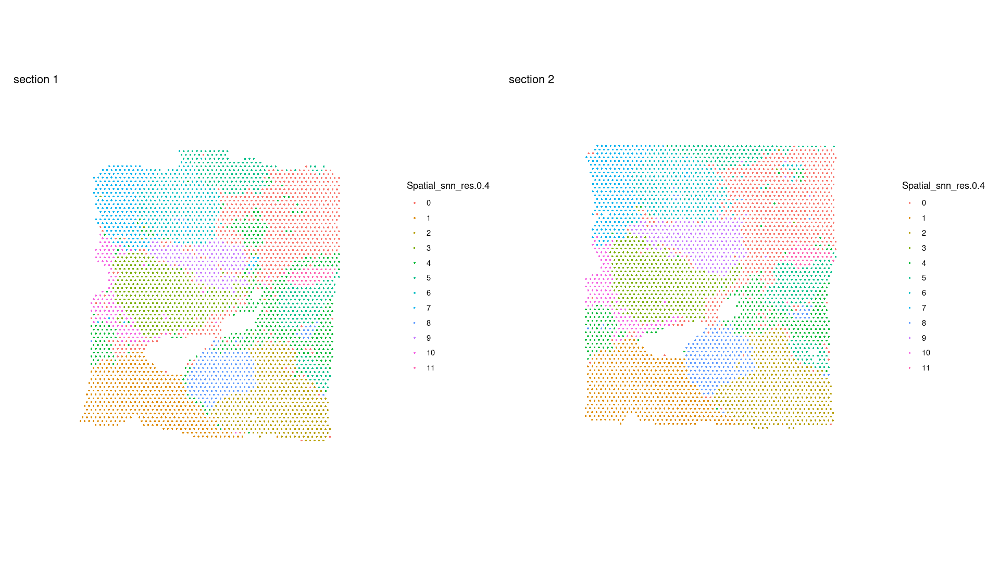

In [35]:
# Grafica los clústeres sin la imagen HE
SpatialDimPlot(SpatialData2, group.by = "Spatial_snn_res.0.4", image.alpha = 0) + theme(legend.position = "right")
MapLabels(SpatialData, column_name = "Spatial_snn_res.0.4", ncol = 2) &
  theme(legend.position = "right")

## Genes expresados diferencialmente

In [36]:
devtools::install_github('immunogenomics/presto')


── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpja25DL/remotes1705e0a92ac/immunogenomics-presto-7636b3d/DESCRIPTION’ ... OK
* preparing ‘presto’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘presto_1.0.0.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [37]:
DefaultAssay(SpatialData) # Verifica el ensayo activo del objeto Seurat SpatialData
Idents(SpatialData) <- "Spatial_snn_res.0.4" # Establece la identidad del objeto según la resolución de agrupamiento (clúster) 0.4

# Comparación de todos los agrupamientos (clústeres) entre sí
SpatialData.markers <- FindAllMarkers(object = SpatialData, # Identifica genes diferencialmente expresados (DEGs)
                                only.pos = TRUE, # Solo genes sobreexpresados en los agrupamientos (clústeres)
                                min.pct = 0.10, # El gen debe estar expresado en al menos 10% de las células
                                logfc.threshold = 0.10) # Umbral de log2 fold change

# Filtra los marcadores con p-valor ajustado < 0.05
SpatialData.markers = SpatialData.markers[which(SpatialData.markers$p_val_adj<0.05),] # Filtra los marcadores identificados para conservar solo aquellos con un valor p ajustado

# Cuenta el número de DEGs por agrupamiento (clúster)
table(SpatialData.markers[, "cluster"]) # ¿Cuántos DEGs hay por grupo?

[1] "Spatial"

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11




   0    1    2    3    4    5    6    7    8    9   10   11 
3819 4591 5109 4854 1238 1784  791 1035  879  924  766  376 

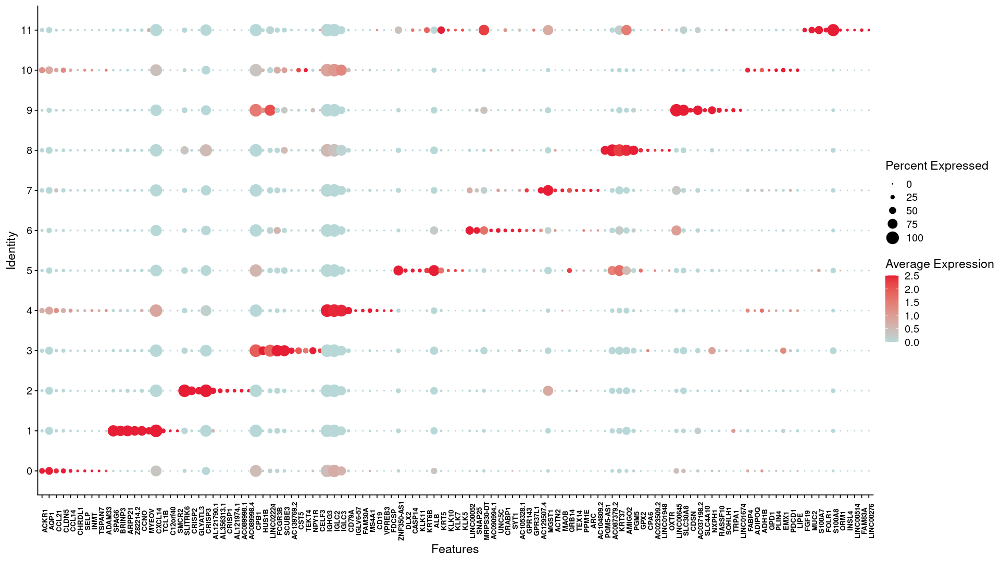

In [38]:
# Selecciona los 10 genes con mayor logFC por agrupamiento (clúster)
SpatialData.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10

# Genera un gráfico de puntos (DotPlot) para los genes seleccionados
DotPlot(SpatialData, features = unique(top10$gene),
        group.by = "Spatial_snn_res.0.4", cols = c('#b8d8d8', '#e71d36'),
        dot.scale = 6, col.min = 0) +
        theme(axis.text.x = element_text(face = "bold", color = c("black"),
        size = 8,angle = 90))

In [39]:
# Ejercicio: Guardar la imagen en un archivo

Picking joint bandwidth of 0.0822

Picking joint bandwidth of 0.0946



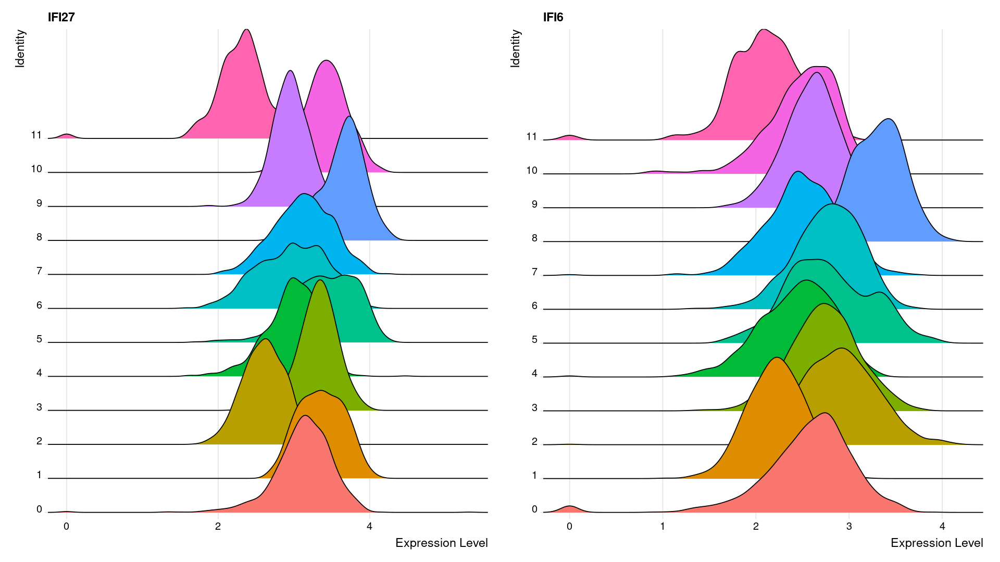

In [40]:
# Grafica genes clave en un gráfico de densidad (ridge plot)
RidgePlot(SpatialData, assay = "Spatial",
          features = c("IFI27","IFI6"), # Genes de interés
          ncol = 2, group.by = "Spatial_snn_res.0.4")

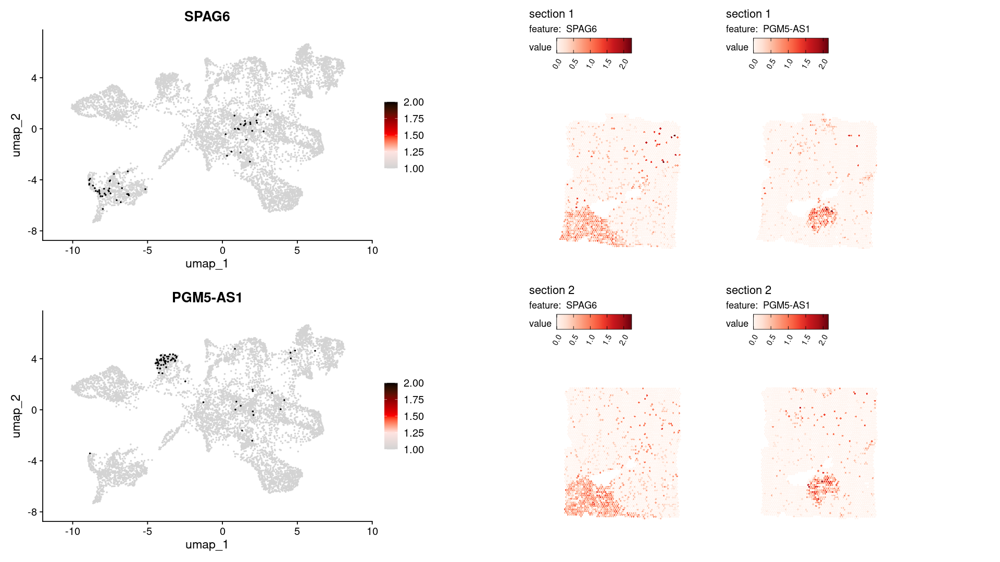

In [41]:
# Visualización UMAP y mapa de calor
# Define el gradiente de color para el mapa de calor
heatmap.colors <- c("lightgray", "mistyrose", "red", "darkred", "black")
fts <- c("SPAG6","PGM5-AS1") # Lista de genes a visualizar
# Genera los gráficos UMAP para cada gen
p.fts <- lapply(fts, function(ftr) {
  FeaturePlot(SpatialData, features = ftr, reduction = "umap", order = TRUE, cols = heatmap.colors, pt.size = )
})
# Grafica expresión transformada en coordenadas de Visium
p3 <- MapFeatures(SpatialData, features = fts, ncol = 2, cols = heatmap.colors, pt.size = 2)
# Combina todos los gráficos en una sola figura
cowplot::plot_grid(cowplot::plot_grid(plotlist = p.fts, ncol = 1), p3, ncol = 2, rel_widths = c(1, 1.3))

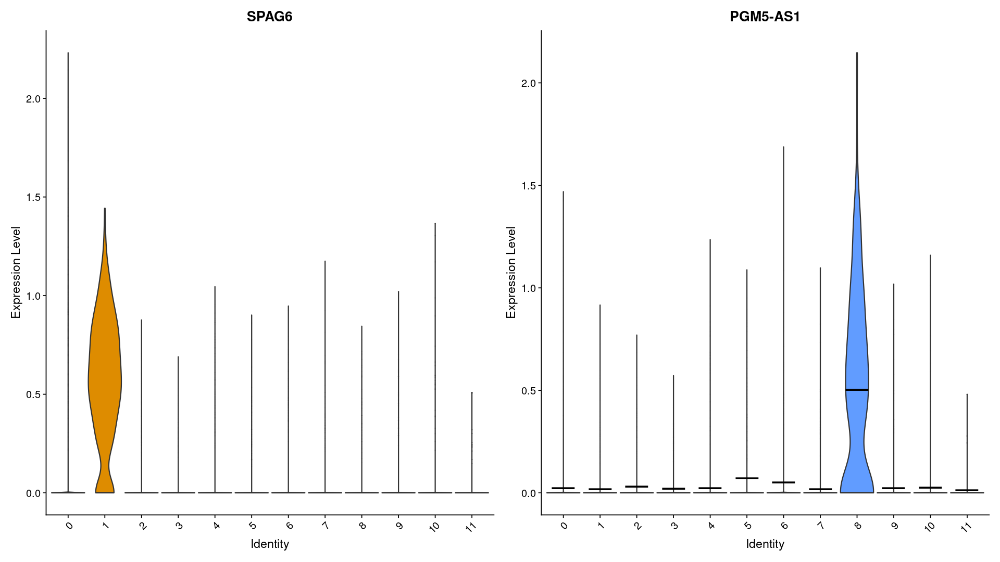

In [42]:
# Gráfico de violín para expresión de EPN2 y AGR3 agrupado por clústeres
# en el objeto Seurat 'SpatialData', agrupando por la resolución de clusterización "Spatial_snn_res.0.4".
VlnPlot(SpatialData, features = c("SPAG6", "PGM5-AS1"),
        group.by = "Spatial_snn_res.0.4", # Definir variable de agrupamiento (resolución de clúster 0,4)
        pt.size = 0, # Establezca el tamaño del punto en 0 para evitar trazar puntos individuales
        ncol = 2) +  # Organiza los gráficos en dos columnas

# Superponer una estadística de resumen (media) como una barra horizontal
  stat_summary(fun.y = mean, geom = "point", shape = 95,
               size = 15, color = "black") +

# Eliminar la leyenda de la gráfica
  NoLegend()

## Visualización 3D

In [43]:
library(plotly)
library(dplyr)
library(htmlwidgets)


Attaching package: ‘htmlwidgets’


The following object is masked from ‘package:Seurat’:

    JS


The following object is masked from ‘package:SeuratObject’:

    JS




In [44]:
xy_coords <- GetCoordinates(SpatialData) |>
  # Note that we use pxl_*_in_fullres here. If ypu have aligned sections, use
  # pxl_*_in_fullres_transformed instead
  dplyr::select(pxl_col_in_fullres, pxl_row_in_fullres, sampleID) |>
  group_by(sampleID) |>
  group_split()

image_info <- GetImageInfo(SpatialData)


In [45]:



# Adjust coordinates
adjusted_coords <- do.call(bind_rows, lapply(seq_along(xy_coords), function(i) {
  xy <- xy_coords[[i]]
  full_width <- image_info[i, ]$full_width
  full_height <- image_info[i, ]$full_height
  xy <- xy |>
    mutate(x = pxl_col_in_fullres/full_width,
           y = pxl_row_in_fullres/full_height) |>
    # Here we can use the sampleID to define a z value.
    # We can also adjust it appropriately to set the distance between the sections.
    mutate(z = sampleID*0.2) |>
    dplyr::select(x, y, z)
}))

In [46]:
# 3D scatter plot with plotly
p <- plot_ly(adjusted_coords, x = ~x, y = ~y, z = ~z, type = "scatter3d", mode = "markers", color = SpatialData$Spatial_snn_res.0.4, size = 3)
saveWidget(as_widget(p), "SpatialData3DPlot.html")

Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”


Ahora puedes ir al explorador de archivos de colab y descargar el html generado para poder ver el plot 3D en tu navegador web

## Términos de ontología génica (GO)

In [47]:
# Selecciona genes diferencialmente expresados (DEGs) del clúster 6
geneList = SpatialData.markers[which(SpatialData.markers$cluster == 6), "gene"]
length(geneList)  # Muestra la cantidad de genes seleccionados

# Convierte los símbolos de genes a IDs de Entrez
columns(org.Hs.eg.db)  # Muestra las columnas disponibles para conversión en la base de anotación

symbol <- mapIds(org.Hs.eg.db,
                 keys = geneList,       # Lista de símbolos de genes a convertir
                 column = "ENTREZID",   # Convertir a IDs de Entrez
                 keytype = "SYMBOL",    # Tipo de entrada: símbolo de gen
                 multiVals = "first")   # Si hay múltiples coincidencias, toma la primera

symbol = as.vector(symbol)  # Convierte a formato vector

# Elimina genes sin ID de Entrez
geneList = symbol
geneList = geneList[which(geneList != "NA")]
length(geneList)  # Muestra la cantidad de genes después del filtrado

# Análisis de enriquecimiento de rutas con ReactomePA
x <- enrichPathway(gene = geneList,
                   organism = "human",
                   pvalueCutoff = 0.05,
                   readable = TRUE,
                   pAdjustMethod = "bonferroni")

head(as.data.frame(x))  # Muestra las primeras filas de los resultados

# Ordena los resultados por valor ajustado de p (de menor a mayor)
x@result = x@result[order(x@result$p.adjust, decreasing = FALSE),]

# Selecciona las 30 rutas más significativas
x@result = x@result[1:30,]

# Ordena rutas por cantidad de genes (de menor a mayor)
x@result = x@result[order(x@result$Count, decreasing = FALSE),]

# Guarda los resultados ordenados en un nuevo data frame
newbar.dt = x@result

# Crea un gráfico de barras con las rutas enriquecidas
cluster6_enrichpathway <- ggbarplot(newbar.dt, x = "Description", y = "Count",
          fill = "Count",         # Colorea las barras según el número de genes
          color = "white",        # Color de borde de las barras en blanco
          sort.val = "asc",       # Ordenar por valor en orden ascendente
          sort.by.groups = FALSE, # No ordenar por grupo
          x.text.angle = 90,      # Rotar etiquetas del eje x para mejor visibilidad
          xlab = "Rutas",
          ylab = "Número de genes",
          legend.title = "Recuentos",
          rotate = TRUE,
          ggtheme = theme_minimal()
) + scale_fill_continuous(low = "#bde0fe", high = "red") +
  theme(text = element_text(size = 20))

[1] 791

[1] "ACCNUM"       "ALIAS"        "ENSEMBL"      "ENSEMBLPROT"  "ENSEMBLTRANS"
 [6] "ENTREZID"     "ENZYME"       "EVIDENCE"     "EVIDENCEALL"  "GENENAME"    
[11] "GENETYPE"     "GO"           "GOALL"        "IPI"          "MAP"         
[16] "OMIM"         "ONTOLOGY"     "ONTOLOGYALL"  "PATH"         "PFAM"        
[21] "PMID"         "PROSITE"      "REFSEQ"       "SYMBOL"       "UCSCKG"      
[26] "UNIPROT"

'select()' returned 1:1 mapping between keys and columns



[1] 754

,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
R-HSA-1428517,R-HSA-1428517,Aerobic respiration and respiratory electron transport,58/529,258/11230,0.2248062,4.772351,13.629039,2.990478e-24,3.908555e-21,3.591722e-21,COX6C/MT-ND1/MT-CO1/MT-ND2/GOT2/MT-CO2/MT-ATP6/ATP5F1E/MT-CO3/NDUFA10/MT-ATP8/MT-ND3/MT-ND5/GLO1/HSPA9/SDHC/MT-ND4/COX16/ATP5F1B/LETM1/ATP5ME/NDUFS2/UQCC2/ATP5MC3/MT-CYB/UQCR10/SUCLG2/UQCRFS1/ATP5F1A/LDHB/IDH2/NDUFC1/COA3/COX17/COX14/COX20/MPC2/NDUFAF3/NDUFB1/COX7A2L/PDHB/ACO2/ATP5PF/NDUFAF8/RANBP9/SDHA/MDH2/PYURF/NNT/NDUFS1/GID8/COX8A/NDUFAB1/ISCA2/NDUFA5/COX7C/COQ10B/NDUFA1,58
R-HSA-611105,R-HSA-611105,Respiratory electron transport,39/529,157/11230,0.2484076,5.273380,11.988776,3.166767e-18,4.138965e-15,1.901727e-15,COX6C/MT-ND1/MT-CO1/MT-ND2/GOT2/MT-CO2/MT-CO3/NDUFA10/MT-ND3/MT-ND5/HSPA9/SDHC/MT-ND4/COX16/LETM1/NDUFS2/UQCC2/MT-CYB/UQCR10/UQCRFS1/NDUFC1/COA3/COX17/COX14/COX20/NDUFAF3/NDUFB1/COX7A2L/NDUFAF8/SDHA/MDH2/PYURF/NDUFS1/COX8A/NDUFAB1/NDUFA5/COX7C/COQ10B/NDUFA1,39
R-HSA-9837999,R-HSA-9837999,Mitochondrial protein degradation,29/529,96/11230,0.3020833,6.412847,11.841914,2.502810e-16,3.271173e-13,1.002002e-13,MT-ND1/MT-CO1/MT-ND2/MT-CO2/MT-ATP6/MT-ND5/HSPA9/PCCB/ATP5F1B/GLUD1/CHCHD2/SUCLG2/ATP5F1A/IDH2/ECH1/OXCT1/HSPD1/IARS2/PDHB/ACO2/APP/ATP5PF/MDH2/NDUFS1/ACOT2/OPA1/SMDT1/LONP1/BDH1,29
R-HSA-6799198,R-HSA-6799198,Complex I biogenesis,17/529,67/11230,0.2537313,5.386395,8.006466,8.070275e-09,1.054785e-05,2.423206e-06,MT-ND1/MT-ND2/NDUFA10/MT-ND3/MT-ND5/HSPA9/MT-ND4/NDUFS2/NDUFC1/NDUFAF3/NDUFB1/NDUFAF8/PYURF/NDUFS1/NDUFAB1/NDUFA5/NDUFA1,17
R-HSA-77387,R-HSA-77387,Insulin receptor recycling,11/529,30/11230,0.3666667,7.783869,8.272090,5.518894e-08,7.213195e-05,1.325697e-05,PTPN1/ATP6AP1/ATP6V1G1/ATP6V0C/ATP6V1C1/ATP6V1H/ATP6V1A/ATP6V0D1/PTPRF/ATP6V1D/ATP6V0E1,11
R-HSA-72766,R-HSA-72766,Translation,42/529,368/11230,0.1141304,2.422845,6.170391,8.489081e-08,1.109523e-04,1.699306e-05,MT-ND1/MT-CO1/MT-ND2/SRP14/MRPS30/MT-CO2/EIF4EBP1/MT-ATP6/MT-CO3/EIF4E/MT-ATP8/MT-ND3/MT-ND5/MT-ND4/EEF1A2/RPL23A/RBX1/MT-CYB/MT-ND4L/RPL4/SRP9/EIF2S3/MRPS18B/SPCS1/GSPT1/RPL9/MRPL14/RPL26/IARS2/RPN1/RPN2/MRPL13/MRPS23/GFM1/EIF4A1/RPS27L/APEH/NDUFAB1/EIF2S2/PSMD11/CHCHD1/SSR1,42


## Análisis de vías con EnrichR

Enrichr ... 
Connection is Live!

FlyEnrichr ... 
Connection is Live!

WormEnrichr ... 
Connection is Live!

YeastEnrichr ... 
Connection is Live!

FishEnrichr ... 
Connection is Live!

OxEnrichr ... 
Connection is Live!



geneCoverage,genesPerTerm,libraryName,link,numTerms,appyter,categoryId
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>
23601,2395,ARCHS4_Cell-lines,http://amp.pharm.mssm.edu/archs4,125,5496ef9c9ae9429184d0b9485c23ba468ee522a8,5
20883,299,ARCHS4_IDG_Coexp,http://amp.pharm.mssm.edu/archs4,352,ce60be284fdd5a9fc6240a355421a9e12b1ee84a,4
19612,299,ARCHS4_Kinases_Coexp,http://amp.pharm.mssm.edu/archs4,498,6721c5ed97b7772e4a19fdc3f797110df0164b75,2
25983,299,ARCHS4_TFs_Coexp,http://amp.pharm.mssm.edu/archs4,1724,8a468c3ae29fa68724f744cbef018f4f3b61c5ab,1
21809,2316,ARCHS4_Tissues,http://amp.pharm.mssm.edu/archs4,108,4126374338235650ab158ba2c61cd2e2383b70df,5
4271,128,Achilles_fitness_decrease,http://www.broadinstitute.org/achilles,216,83a710c1ff67fd6b8af0d80fa6148c40dbd9bc64,4
4320,129,Achilles_fitness_increase,http://www.broadinstitute.org/achilles,216,98366496a75f163164106e72439fb2bf2f77de4e,4
16129,292,Aging_Perturbations_from_GEO_down,http://www.ncbi.nlm.nih.gov/geo/,286,cd95fe1b505ba6f28cd722cfba50fdea979d3b4c,8
15309,308,Aging_Perturbations_from_GEO_up,http://www.ncbi.nlm.nih.gov/geo/,286,74c4f0a0447777005b2a5c00c9882a56dfc62d7c,8


[1] 791

Uploading data to Enrichr... Done.
  Querying Cancer_Cell_Line_Encyclopedia... Done.
  Querying Elsevier_Pathway_Collection... Done.
  Querying KEGG_2021_Human... Done.
  Querying CellMarker_Augmented_2021... Done.
  Querying Reactome_2016... Done.
  Querying GO_Biological_Process_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying InterPro_Domains_2019... Done.
Parsing results... Done.


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
BT483 BREAST,32/203,2.245435e-11,1.843502e-08,0,0,4.693895,115.092143,PNCK;SYCP2;ASH2L;GATA3;SEMA3F;AFF3;CACNA1H;RERG;HS6ST3;SERPINA5;RAB11FIP1;UPK1A;TRPS1;EFHD1;SPTSSB;ANXA9;DCAF10;DSCAM-AS1;MPP2;BRF2;IRX5;WWP1;ERLIN2;PRLR;P2RX2;KRT37;MGP;TFF3;PDCD4;HIST1H4H;TFF1;ZNF552
MCF7 BREAST,26/170,3.275166e-09,1.344456e-06,0,0,4.499728,87.910717,KCNE4;USP32;SYNPO2;CRABP1;ALOX15;GDPD3;GATA3;RERG;SERPINA5;FAM102B;H2AFJ;SLC39A6;SPTSSB;ANXA9;RGS22;NCAM2;DSCAM-AS1;SGCG;LINC00052;ELP2;COX6C;PRLR;SFXN1;GRB2;TFF1;FBP1
HCC1500 BREAST,29/230,3.663280e-08,1.002518e-05,0,0,3.599013,61.623456,SYCP2;LRP2;AFF3;DNALI1;RERG;HS6ST3;SERPINA5;SLC39A6;EFHD1;NCAM2;DCAF10;DSCAM-AS1;ZNF587;ATP6V1G1;BRF2;IRX5;GP2;WWP1;ELP2;ERLIN2;PRLR;TTC39A;MGP;TFF3;TFF1;PLCD4;GAS8;PVALB;ZNF552
HCC1419 BREAST,33/326,8.150742e-07,1.416651e-04,0,0,2.810648,39.405244,NAPA;SYCP2;CITED4;KIAA0100;MRPL13;SIPA1L3;GSPT1;RERG;HS6ST3;AKR7A3;UPK1A;RNF139;TRPS1;PNPO;EFHD1;SPTSSB;RGS22;DSCAM-AS1;ATP6V1C1;POLR2K;BCAS1;COX8A;TSPYL1;WWP1;PRLR;AZIN1;TTC39A;AZGP1;TFF3;PADI2;SCGB2A2;TFF1;ZNF552
HCC1428 BREAST,25/209,8.627597e-07,1.416651e-04,0,0,3.374567,47.119519,SYCP2;SLC1A2;CST9;PCDH19;RERG;TRPS1;EFHD1;CPNE3;SPTSSB;NDP;DSCAM-AS1;ZNF587;IRX5;ITPK1;PRLR;HIST2H2BE;TTC39A;SLC7A8;KRT37;TFF3;PDCD4;HIST1H4H;TFF1;FKBP4;ZNF552
YMB1 BREAST,27/250,2.376142e-06,3.251354e-04,0,0,3.008839,38.964569,ARF1;CRABP1;HS6ST3;AKR7A3;UPK1A;MB;TRPS1;BAHD1;IARS2;DSCAM-AS1;CGA;BRF2;IRX5;CCDC57;DCXR;CEL;MMEL1;PRLR;AZGP1;PPT1;PADI2;SCGB2A2;TFF1;FKBP4;FGFR4;FBP1;PVALB
CAMA1 BREAST,18/142,1.296125e-05,1.520169e-03,0,0,3.583963,40.332292,IRX5;CRABP1;GDPD3;GATA3;LRP2;PRLR;SCGB1D2;TRPS1;HIST1H4H;EFHD1;SCGB2A2;TFF1;SPTSSB;NCAM2;DSCAM-AS1;FGFR4;PVALB;ZNF552
EFM192A BREAST,18/163,8.315498e-05,7.600185e-03,0,0,3.061534,28.762510,LINC00052;GDPD3;MMEL1;PRLR;TSKU;CACNA1H;RNF139;SCGB1D2;MB;TRPS1;ORMDL3;SCGB2A2;SPTSSB;DSCAM-AS1;FGFR4;C8ORF76;ZNF552;BCAS1
UACC812 BREAST,36/460,8.331507e-05,7.600185e-03,0,0,2.112520,19.842652,SYCP2;LRRC10B;GDPD3;YBX2;GATA3;KIAA0100;SEMA3F;CACNA1H;SCGB1D2;LCN12;TRPS1;ORMDL3;EFHD1;SNCG;SPTSSB;ANXA9;DSCAM-AS1;CGA;ZNF587;SGCG;BCAS1;INTS3;MMEL1;SLC50A1;TTC39A;SYT7;SMOC2;SLC7A8;P2RX2;KRT37;MMRN2;TFF3;SCGB2A2;TFF1;PVALB;ZNF552


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Protein Folding,6/13,5.076757e-06,0.003932051,0,0,20.966697,255.60160,HSPA8;HSP90AA1;ST13;BAG1;FKBP4;HSPA1A
Mitochondrial Protein Transport,7/20,7.274840e-06,0.003932051,0,0,13.184066,155.98185,HSPA9;GRPEL1;BAG1;TOMM20;TOMM22;HSPA1A;TOMM6
ADORA1/2A -> Exocytosis,6/15,1.383256e-05,0.004984332,0,0,16.305732,182.43645,HSPA8;SNAP25;SYT1;ADORA2A;SYT7;VAMP2
Catecholamines Secretion from Adrenal Gland,10/54,4.363498e-05,0.011792352,0,0,5.577057,55.99171,VAMP8;NAPA;SNAP25;SLC7A5;SYT1;GNAS;VAMP2;CACNA1H;RAB11A;ARF6
Metabolic Reprogramming in Cancer: Overview,10/63,1.691140e-04,0.034829731,0,0,4.627836,40.19246,ACLY;LDHB;GLUD1;PGAM1;IDH2;SDHC;SDHA;SLC16A3;FBP1;HK2
Brain Dysfunction in Phenylketonuria,4/9,2.609086e-04,0.034829731,0,0,19.521220,161.07623,GLUD1;SLC7A5;IDH2;ACO2
Mitochondrial Respiratory Chain Dysfunction,4/9,2.609086e-04,0.034829731,0,0,19.521220,161.07623,APP;BAG1;HSPA1A;SOD1
Norepinephrine Neuronal Release,8/44,2.892056e-04,0.034829731,0,0,5.441464,44.33908,NAPA;VAMP8;SNAP25;SLC7A5;SYT1;RAB11A;VAMP2;ARF6
Exocytosis: Vesicle Fusion,5/16,2.899793e-04,0.034829731,0,0,11.102244,90.43556,NAPA;SNAP25;SYT1;RAB11A;VAMP2


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Oxidative phosphorylation,32/133,9.393982e-17,2.752437e-14,0,0,7.976311,294.35679,ATP6V1A;NDUFA10;COX17;ATP5MC3;NDUFB1;UQCR10;COX7C;ATP5F1A;ATP5F1B;ATP6V1H;UQCRFS1;ATP6V1D;ATP6V1C1;ATP5ME;COX8A;ATP5PF;ATP6V1G1;ATP6V0E1;ATP6AP1;NDUFA5;NDUFA1;SDHC;NDUFC1;SDHA;COX6C;ATP5F1E;COX7A2L;NDUFAB1;NDUFS2;NDUFS1;ATP6V0D1;ATP6V0C
Thermogenesis,34/232,4.201630e-11,6.155388e-09,0,0,4.312437,103.03691,COX16;NDUFA10;COX17;ATP5MC3;NDUFB1;UQCR10;COX7C;ATP5F1A;ATP5F1B;UQCRFS1;COX14;ATP5ME;COX8A;ATP5PF;COA3;NDUFA5;NDUFA1;SDHC;NDUFC1;ACSL3;CPT1C;COX6C;SDHA;ATP5F1E;MAPK13;COX7A2L;NDUFAF8;NDUFAB1;GNAS;NDUFAF3;NDUFS2;GRB2;NDUFS1;COX20
Prion disease,32/273,4.224474e-08,4.125903e-06,0,0,3.318277,56.34364,PSMD11;NDUFA10;ATP5MC3;ITPR2;NDUFB1;UQCR10;KLC1;COX7C;ATP5F1A;ATP5F1B;UQCRFS1;NCAM2;COX8A;ATP5PF;HSPA8;NDUFA5;TUBB;NDUFA1;SDHC;NDUFC1;COX6C;SDHA;ATP5F1E;MAPK13;SOD1;COX7A2L;CSNK2B;NDUFAB1;NDUFS2;NDUFS1;HSPA1B;HSPA1A
Parkinson disease,30/249,6.023715e-08,4.412371e-06,0,0,3.418357,56.83011,PSMD11;NDUFA10;ATP5MC3;ITPR2;NDUFB1;UQCR10;PARK7;KLC1;COX7C;ATP5F1A;ATP5F1B;UQCRFS1;COX8A;ATP5PF;NDUFA5;TUBB;NDUFA1;UBE2G1;SDHC;NDUFC1;COX6C;SDHA;ATP5F1E;COX7A2L;ADORA2A;NDUFAB1;GNAS;NDUFS2;NDUFS1;CALM1
Huntington disease,33/306,1.908065e-07,1.118126e-05,0,0,3.019745,46.72152,BECN1;PSMD11;DCTN1;CLTC;NDUFA10;SLC1A2;ATP5MC3;NDUFB1;UQCR10;KLC1;COX7C;DNALI1;ATP5F1A;ATP5F1B;POLR2A;UQCRFS1;POLR2K;COX8A;ATP5PF;NDUFA5;TUBB;NDUFA1;SDHC;NDUFC1;AP2B1;COX6C;SDHA;ATP5F1E;SOD1;COX7A2L;NDUFAB1;NDUFS2;NDUFS1
Synaptic vesicle cycle,15/78,3.394735e-07,1.657762e-05,0,0,5.874448,87.50501,ATP6V1A;NAPA;SNAP25;ATP6V1G1;ATP6V0E1;SYT1;CLTC;SLC1A2;AP2B1;ATP6V1H;ATP6V0D1;ATP6V0C;ATP6V1D;VAMP2;ATP6V1C1
Diabetic cardiomyopathy,25/203,4.977486e-07,2.083433e-05,0,0,3.489417,50.64250,NDUFA10;ATP2A3;ATP5MC3;NDUFB1;UQCR10;PDHB;COX7C;ATP5F1A;ATP5F1B;MPC2;UQCRFS1;COX8A;ATP5PF;NDUFA5;NDUFA1;SDHC;NDUFC1;COX6C;SDHA;ATP5F1E;MAPK13;COX7A2L;NDUFAB1;NDUFS2;NDUFS1
Citrate cycle (TCA cycle),9/30,1.531180e-06,5.607948e-05,0,0,10.515893,140.80226,ACLY;MDH2;IDH2;SUCLG2;SDHC;PDHB;ACO2;SDHA;PCK2
Vibrio cholerae infection,11/50,3.144661e-06,1.002175e-04,0,0,6.931953,87.82649,ATP6V1A;ARF1;ATP6V1G1;ATP6V0E1;ATP6AP1;GNAS;ATP6V1H;ATP6V0D1;ATP6V0C;ATP6V1D;ATP6V1C1


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Natural Killer T (NKT) cell:Fetal Kidney,326/4543,1.616787e-32,1.225525e-29,0,0,2.492417,182.45058,RPL4;CYFIP2;EIF4A1;ARL6IP1;ZMYND8;EMC10;GHITM;MICOS10;RPL9;TXNDC17;PPP2R1A;CPNE3;SNRPD3;FBXO9;SKP1;GABARAPL2;ATP6V1G1;TSPYL1;ATP6V0E1;TSTD1;ECH1;ACTN4;EML2;EID1;PYURF;COX7A2L;PRKAR1A;BOLA3;CSNK2B;ACOT2;SUCLG2;RPL26;PFN1;BEX4;CUTA;TMEM87A;LRPAP1;URI1;SET;RPN2;PRKDC;CTBP1;NOLC1;MRPL14;SNU13;GATA3;MRPL13;ARPP19;GSPT1;MTDH;LDHB;RAB11FIP1;GRPEL1;ZNF706;PCBP1;PCBP2;HLTF;TSPAN5;SARAF;SSR1;PSMF1;RAB11FIP4;SERF2;DECR1;FDFT1;HEXIM1;BTF3;XRCC6;JUND;ST13;LRBA;TMA7;GLUD1;C6ORF89;TASOR2;NDUFAF3;SFXN1;HNRNPC;CALM1;ARF3;PHF3;ARF1;GFM1;CETN2;PIGP;ASH2L;COX7C;AIFM1;C1QBP;ANXA6;TMED3;TMED2;SDF2;TMED4;DUSP4;COX8A;LYPLA1;PGAM1;TUBB;ITPK1;RHOH;C1ORF43;NUTF2;COQ10B;SRP9;COPZ1;RHOA;GNL3;MLF2;DDB1;VAMP8;HADHB;SLC7A5;UFC1;STRAP;ALDOC;ARHGEF2;TLCD1;MAPRE1;VAMP5;PTMA;ERGIC1;VAMP2;ARF6;PAFAH1B1;RAB7A;NAPA;RNASEK;ECHS1;SF3B6;IFI6;NOL7;RPS27L;NEDD8;MRPS30;UQCR10;EXOSC6;ERMP1;RNF139;ORMDL3;EMC4;FLNB;SPTSSB;EMC6;EXOSC3;EMC7;MICB;BCAP31;P2RY10;MDH2;YIPF3;ELP2;UBE2G1;COX6C;LRPPRC;RAB11A;TMCO1;TMEM59;XAB2;SPCS1;GID8;NDUFAB1;TSR2;TSR1;TCEA1;COPG1;NUCB2;MTCH1;SYAP1;NDUFA10;MRFAP1;NUCKS1;PARK7;APEH;SRP14;BZW1;TOMM20;TOMM22;CHCHD5;LAPTM4A;CHCHD2;LAMP1;MPC2;RUVBL1;SLC16A3;TMEM14B;HMGN1;RAB2A;TPD52;PDIA3;SUPT16H;SHISA5;SDHC;ZCRB1;SDHA;ILF2;RBX1;GPRIN3;CTDNEP1;ACLY;MORF4L1;TMEM256;KAT6B;NCL;RPL7L1;SPECC1L;ERH;AAGAB;SLC27A2;PPIA;SRSF9;IDI1;TMED10;COX16;ABHD2;INSIG1;COX17;STK39;TOR1AIP2;PDS5A;PRPF8;TOR1AIP1;SLC9A3R1;ADGRG1;FUT8;BAG1;COX14;SUDS3;ATP6V1D;UBE2F;HSPA9;COA3;MOAP1;HSPA8;TRAPPC1;UQCC2;GOT2;OSBPL2;IDH2;LSM1;TBCA;EIF2S2;TMEM230;EIF2S3;CNOT1;BAMBI;BHLHE40;GNAS;ACO2;DYNLRB1;GRSF1;NOP10;RNF187;YWHAE;HSP90AB1;WDR1;YWHAB;ATP2A3;BRK1;DBI;CHD3;ATRAID;GPHN;IRF2BPL;TMEM101;SUMO1;OPA1;AP1G1;SUMO3;SUMO2;UQCRFS1;SNAP29;BCAS1;EIF5A;HSP90AA1;DCXR;SMIM19;ATP6AP2;YWHAZ;COASY;SMDT1;RCN2;DAD1;MCM3;NDUFS2;TERF2IP;TMBIM6;NAA38;POLDIP2;DCTN1;RAP1GDS1;NDUFB1;SLC3A2;RNF7;PDHB;CXXC5;RNF5;HSPD1;MIEN1;POLR2A;RBBP4;OXCT1;PCED1B;RBBP7;AAMP;POLR2K;DCAF13;PTPN1;CYB5A;SPAG7;NDUFA5;CCDC57;CNBP;NDUFA1;RPL23A;SLC50A1;MAPK13;SOD1;POLE4;GLOD4;PDCD4;OCIAD1;RANGRF;ATXN10;C8ORF76;RAN
Mitotic Fetal Germ cell:Fetal Gonad,59/650,2.563001e-09,9.713773e-07,0,0,2.539139,50.22947,RPL4;WDR1;YWHAB;QPRT;ATP2A3;ASH2L;TFCP2L1;RPL9;CKS1B;DHTKD1;LAPTM4B;LAPTM4A;PNP;C1QBP;ANXA6;CHP1;HMGN1;COX8A;PGAM1;TUBB;DCXR;MRPS18B;SHISA5;GNL3;SUMF1;PTBP3;VAMP8;SLC7A8;CDC42EP4;RPL7L1;CLDN7;MYADM;SUCLG2;ALDOC;RPL26;PFN1;ALDH7A1;RBM47;SLC3A2;CXXC5;ADIPOR1;BPHL;PRDX3;LDHB;UGCG;EXOSC6;PCED1B;FLNB;RAB11FIP4;BTF3;VAT1;MARCKSL1;JUP;RPL23A;GLUD1;EIF2S3;NDUFAB1;CD9;NOP10
Astrocyte:Embryonic Prefrontal Cortex,38/342,1.010322e-08,2.552746e-06,0,0,3.138280,57.77703,DDR1;IDI1;ABCD3;LRRC10B;SLC1A2;ITPR2;MSMO1;DBI;SLC3A2;COMT;TOR1AIP1;CST3;SLC9A3R1;ADGRG1;ALCAM;HES1;TSPAN3;METTL7A;CA12;SYT1;IGFBP4;TUBB;DCXR;CYP51A1;GPR37L1;SEZ6L;AIF1L;HADHB;GLUD1;ALDH6A1;G6PC3;SCD;CDC42EP4;CD9;ALDOC;DHCR7;PTMA;RAMP1
Endocrine cell:Pancreatic Islet,19/101,1.375445e-08,2.606469e-06,0,0,5.740759,103.91866,BCAP31;ATP6V0E1;TRAPPC1;RNASEK;WDR1;YIPF3;SHISA5;BRK1;ATRAID;GABARAP;RHOA;HEBP1;LAPTM4A;DAD1;NPC2;NDUFAF3;PFN1;VAMP5;SERF2
Paneth cell:Undefined,17/96,1.988247e-07,3.014182e-05,0,0,5.318582,82.07020,COA3;ABCD3;ECHS1;POLDIP2;MAGEF1;GOT2;PEBP1;DHCR24;NR2F6;PRDX3;AIFM1;MPC2;TMED2;SUCLG2;IARS2;ALDH9A1;PAIP1
Epithelial cell:Thymus,16/102,2.431688e-06,3.072033e-04,0,0,4.590668,59.34322,FOXA1;MAGI1;NCKAP1;SEMA3F;TSKU;SYT7;PTPRF;TTC39A;BCAM;CDH1;CLDN7;SCNN1A;CHMP4C;MAL2;S100A14;TSPAN1
Sertoli cell:Fetal Gonad,38/446,8.147226e-06,8.822282e-04,0,0,2.325463,27.24939,CYFIP2;PRPS2;BEX4;ISYNA1;PNCK;IFI6;PEBP1;SLC3A2;SPINT2;TMEM97;CXXC5;COMT;HS6ST1;PTPRF;HK2;SERPINA5;TXNDC17;IGF1R;CST3;ADGRG1;AP1G1;HLTF;PCED1B;GSE1;VPS35;FLNB;CKB;RBBP7;TSTD1;JUP;MID1IP1;ECH1;WWP1;C4ORF48;PTBP3;TFF3;OBSL1;HSPA1A
Cancer Stem cell:Serum,15/102,1.

Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
CHCH,4/7,7.723944e-05,0.03189989,0,0,32.538755,308.09646,CHCHD5;CHCHD2;CHCHD10;CHCHD1
"ATP:guanido phosphotransferase, N-terminal",3/5,5.805138e-04,0.03956012,0,0,36.561548,272.44192,CKMT1A;CKMT1B;CKB
"ATP:guanido phosphotransferase, catalytic domain",3/5,5.805138e-04,0.03956012,0,0,36.561548,272.44192,CKMT1A;CKMT1B;CKB
"ATPase, F1/V1/A1 complex, alpha/beta subunit, N-terminal domain",3/5,5.805138e-04,0.03956012,0,0,36.561548,272.44192,ATP6V1A;ATP5F1A;ATP5F1B
"ATPase, F1/V1/A1 complex, alpha/beta subunit, nucleotide-binding domain",3/5,5.805138e-04,0.03956012,0,0,36.561548,272.44192,ATP6V1A;ATP5F1A;ATP5F1B
Sumo domain,3/5,5.805138e-04,0.03956012,0,0,36.561548,272.44192,SUMO1;SUMO3;SUMO2
LIS1 homology motif,6/28,6.705104e-04,0.03956012,0,0,6.666010,48.71168,TBL1XR1;GID8;NOLC1;RANBP9;TBL1X;PAFAH1B1
Rad60/SUMO-like domain,3/6,1.126856e-03,0.05817394,0,0,24.373096,165.45247,SUMO1;SUMO3;SUMO2
"Histone H2A, C-terminal domain",5/23,1.775031e-03,0.07905122,0,0,6.782231,42.95822,HIST3H2A;H2AFY;H2AFZ;H2AFJ;HIST1H2AC


Ignoring unknown labels:
• colour : "Recuentos"
• linetype : "Recuentos"
• shape : "Recuentos"


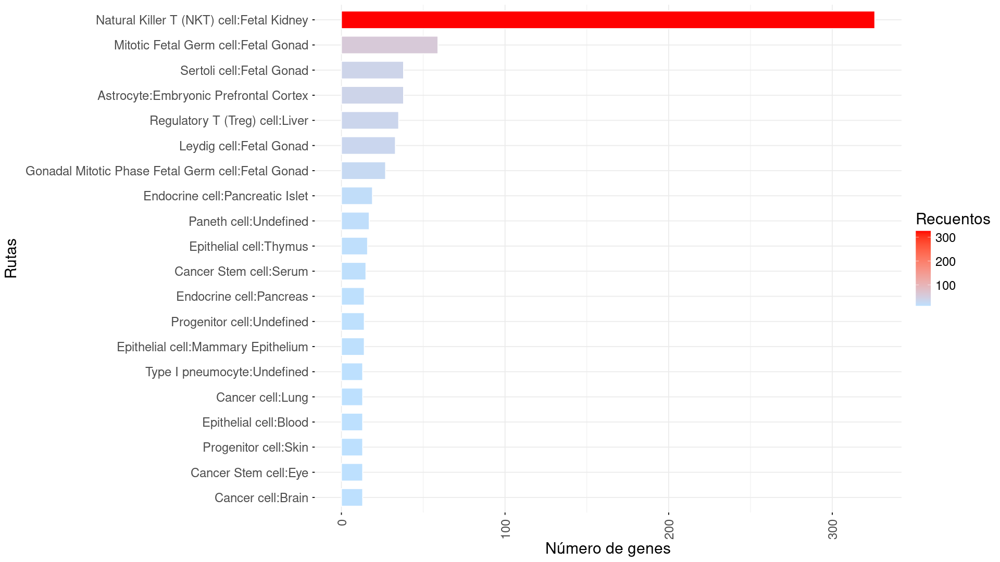

In [48]:
# Lista las bases de datos disponibles en EnrichR
listEnrichrSites()
dbs <- listEnrichrDbs()

# Ordena las bases de datos por nombre
dbs %>% dplyr::arrange(libraryName)

# Selecciona bases de datos específicas para el análisis de enriquecimiento
dbs <- c("Cancer_Cell_Line_Encyclopedia",
         "Elsevier_Pathway_Collection",
         "KEGG_2021_Human",
         "CellMarker_Augmented_2021",
         "Reactome_2016",
         "GO_Biological_Process_2018",
         "GO_Cellular_Component_2018",
         "GO_Molecular_Function_2018",
         "InterPro_Domains_2019")

# EnrichR necesita símbolos de genes (no IDs de Ensembl)
geneList = SpatialData.markers[which(SpatialData.markers$cluster == 6), "gene"]
length(geneList)  # Muestra la cantidad de genes seleccionados

# Realiza el análisis de enriquecimiento con EnrichR
enriched.Paths <- enrichr(geneList, dbs)

# Muestra resultados de las bases de datos seleccionadas
enriched.Paths[[1]]  # Cancer_Cell_Line_Encyclopedia
enriched.Paths[[2]]  # Elsevier_Pathway_Collection
enriched.Paths[[3]]  # KEGG_2021_Human
enriched.Paths[[4]]  # CellMarker_Augmented_2021
enriched.Paths[[5]]  # Reactome_2016
enriched.Paths[[6]]  # GO_Biological_Process_2018
enriched.Paths[[7]]  # GO_Cellular_Component_2018
enriched.Paths[[8]]  # GO_Molecular_Function_2018
enriched.Paths[[9]]  # InterPro_Domains_2019

# Selecciona los resultados de CellMarker_Augmented_2021
Rpath = enriched.Paths[[4]]

# Cuenta la cantidad de genes por cada ruta
Gene_Count = c()
for(x in 1:dim(Rpath)[1]){
  Gene_Count = c(Gene_Count, str_split(Rpath$Overlap[x], pattern = "/" )[[1]][1])
}

Rpath$Gene_Count = as.numeric(Gene_Count)

# Ordena por valor ajustado de p (de menor a mayor)
Rpath = Rpath[order(Rpath$Adjusted.P.value, decreasing = FALSE),]

# Filtra rutas significativas (p ajustado < 0.05)
Rpath = Rpath[Rpath$Adjusted.P.value < 0.05,]

# Selecciona las 20 rutas principales
Rpath = Rpath[1:20,]

# Ordena rutas por número de genes (de mayor a menor)
Rpath = Rpath[order(Rpath$Gene_Count, decreasing = TRUE),]

# Crea un gráfico de barras de rutas enriquecidas
cluster6_enrichR <- ggbarplot(Rpath, x = "Term", y = "Gene_Count",
          fill = "Gene_Count",         # Colorea las barras según número de genes
          color = "white",             # Color de borde blanco
          sort.val = "asc",            # Ordena por valor en orden ascendente
          sort.by.groups = FALSE,
          x.text.angle = 90,           # Gira etiquetas para visibilidad
          xlab = "Rutas",
          ylab = "Número de genes",
          legend.title = "Recuentos",
          rotate = TRUE,
          ggtheme = theme_minimal()
) + scale_fill_continuous(low = "#bde0fe", high = "red") +
  theme(text = element_text(size = 18))

# Muestra el gráfico
cluster6_enrichR

# Deconvolución de tipos de células

Cargar un conjunto de datos de singlecell previamente anotado, para este ejemplo usaremos uno celulas de cancer de mama.

In [49]:
download.file('https://github.com/AdolfoRojas/scNotebooks-Resources/raw/refs/heads/main/scRNASeq_pac2_processed.rds', 'ST_Exercises/scRNASeq_pac2_processed.rds')

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Updating matrix keys for DimReduc ‘pca’

Updating matrix keys for DimReduc ‘umap’

Updating matrix keys for DimReduc ‘tsne’

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Updating slots in RNA_nn

Setting default assay of RNA_nn to RNA

Updating slots in RNA_snn

Setting default assay of RNA_snn to RNA

Updating slots in pca

Updating slots in umap

Setting umap DimReduc to global

Updating slots in tsne

Setting tsne DimReduc to global

Setting assay used for NormalizeData.RNA to RNA

Setting assay used for FindVariableFeatures.RNA to RNA

Setting assay used for ScaleData.RNA to RNA

Setting assay used for RunPCA.RNA to RNA

Setting assay used for RunUMAP.RNA.pca to RNA

No assay information could be found for RunTSNE

Warning message:
“Adding a command log without an assay associated with it”
Setting assay used for 


          B_cell           T_cell      Cancer_cell     Myeloid_cell 
             285              620             2837             1532 
Endothelial_cell       Fibroblast              pDC        Mast_cell 
            2597             3020             1253               44 

[1] "RNA"

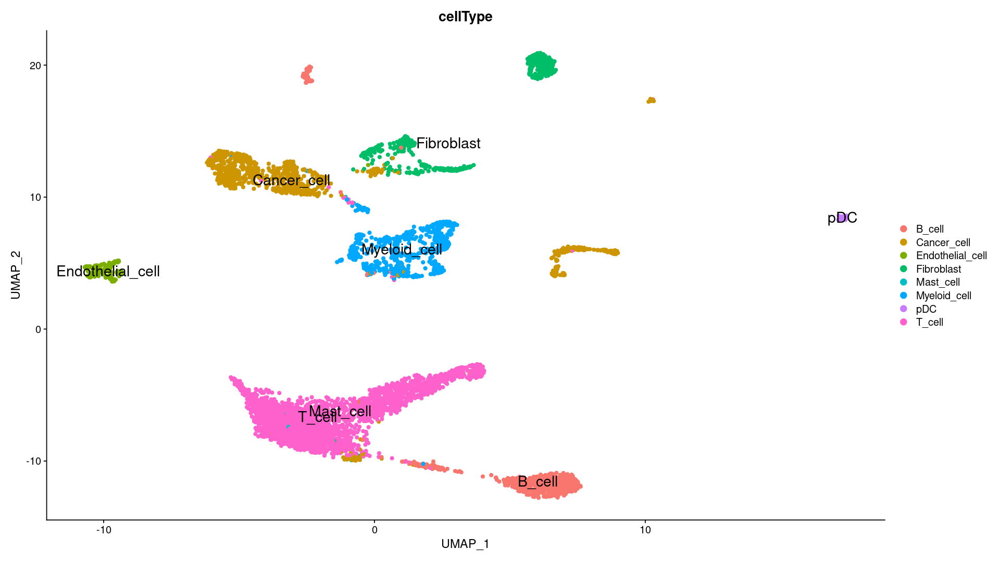

In [50]:
# Carga el dataset de scRNA-seq
SC.data = readRDS("ST_Exercises/scRNASeq_pac2_processed.rds")
SC.data <-UpdateSeuratObject(SC.data)

# Establece identidades de células según tipo celular
Idents(SC.data) = "cellType"

# Visualización UMAP de tipos celulares
DimPlot(object = SC.data, reduction = 'umap', label = TRUE, label.size = 6,
        group.by = "cellType", pt.size = 1.5)

# Identifica DEGs entre todos los agrupamientos (clústeres)
SC.markers <- FindAllMarkers(object = SC.data, only.pos = TRUE, min.pct = 0.10, logfc.threshold = 0.10)
# min.pct = 0.10: al menos 10% de las células debe expresar el gen
# logfc.threshold = 0.10: umbral mínimo de log2 fold change para considerar el gen como marcador

SC.markers = SC.markers[which(SC.markers$p_val_adj < 0.05 & SC.markers$avg_log2FC > 0.5),]
# SC.markers$p_val_adj < 0.05: This condition selects markers with an adjusted p-value less than 0.05, meaning they are statistically significant.
# SC.markers$avg_log2FC > 0.5: This condition selects markers with an average log2 fold change greater than 0.5

# Cuenta el número de DEGs por agrupamiento (clúster)
table(SC.markers$cluster)

DefaultAssay(SC.data) # devuelve el nombre del ensayo actualmente establecido como predeterminado para el objeto Seurat

## Flujo en Tubería (Pipeline) de deconvolución

La deconvolución es una técnica computacional que se utiliza para inferir y cuantificar las proporciones de diferentes tipos celulares dentro de una población celular mixta. Dado que los datos de scRNA-seq suelen provenir de tejidos complejos que contienen múltiples tipos celulares, la deconvolución ayuda a identificar y aislar los perfiles de expresión génica específicos de cada tipo celular dentro de la mezcla.

¿Por qué es importante la deconvolución?

* Identificación de tipos celulares: La deconvolución permite a los investigadores determinar la presencia y abundancia de varios tipos celulares en una muestra de tejido heterogénea.
* Comprender la composición celular: Ayuda a dilucidar la composición celular de los tejidos, revelando cómo los diferentes tipos celulares contribuyen a los procesos biológicos y las enfermedades.
* Mejorar la interpretación de datos: Al separar las señales de expresión génica de los diferentes tipos celulares, la deconvolución mejora la precisión y la interpretabilidad de los datos de scRNA-seq, lo que permite obtener información biológica más precisa.


In [51]:
#ti <- Sys.time()
DefaultAssay(SpatialData) <- "Spatial"
SpatialData <- RunNNLS(object = SpatialData,
                      singlecell_object = SC.data,
                      groups = "cellType")



── Predicting cell type proportions ──



ℹ Fetching data from Seurat objects

→   Filtering out features that are only present in one data set

→   Kept 1479 features for deconvolution

Warning message:
“The NNLS function might break if a dev version of RcppML is used. 
• If RcppML::project(...) fails, try installing CRAN version 0.3.7 of RcppML.”
ℹ Preparing data for NNLS

→   Downsampling scRNA-seq data to include a maximum of 50 cells per cell type

→   Kept 8 cell types after filtering

→   Calculating cell type expression profiles

ℹ Predicting cell type proportions with NNLS for 8 cell types

ℹ Returning results in a new 'Assay' named 'celltypeprops'

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”
ℹ Setting default assay to 'celltypeprops'

✔ Finished



In [52]:
# Check available cell types
rownames(SpatialData)

[1] "B-cell"           "Cancer-cell"      "Endothelial-cell" "Fibroblast"      
[5] "Mast-cell"        "Myeloid-cell"     "T-cell"           "pDC"

In [53]:
# Load H&E images
SpatialData <- SpatialData |>
  LoadImages()



── Loading H&E images ──



ℹ Loading image from /content/ST_Exercises/Spatial_Section_1/tissue_lowres_image.png

ℹ Scaled image from 600x600 to 400x400 pixels

ℹ Loading image from /content/ST_Exercises/Spatial_Section_2/tissue_lowres_image.png

ℹ Scaled image from 600x600 to 400x400 pixels

ℹ Saving loaded H&E images as 'rasters' in Seurat object



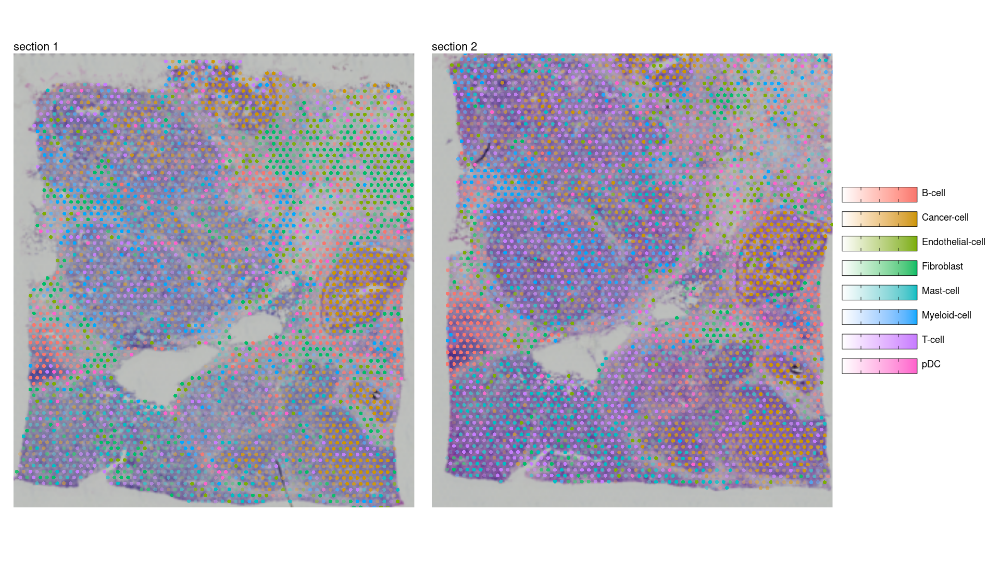

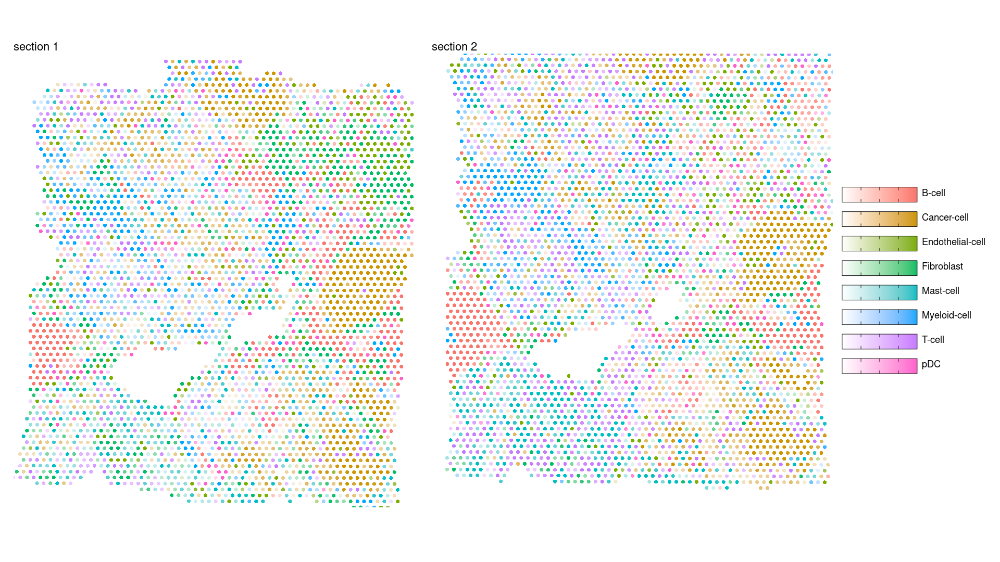

In [54]:
# Plot multiple features
MapMultipleFeatures(SpatialData,
                    image_use = "raw",
                    pt_size = 2, max_cutoff = 0.95,
                    override_plot_dims = TRUE,
                    features = rownames(SpatialData)) +
  plot_layout(guides = "collect")

MapMultipleFeatures(SpatialData,
                    pt_size = 2, max_cutoff = 0.95,
                    override_plot_dims = TRUE,
                    features = rownames(SpatialData)) +
  plot_layout(guides = "collect")

## Cell type co-localization

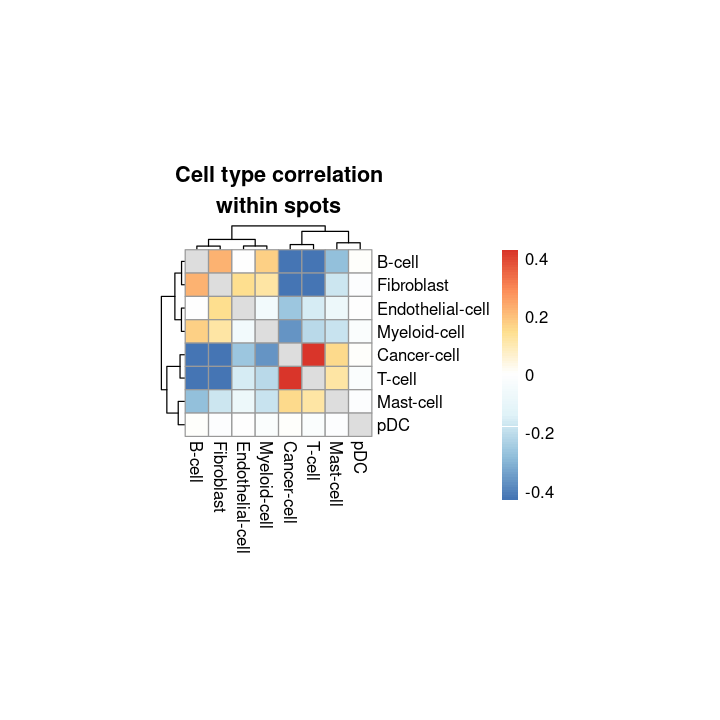

In [55]:
library(pheatmap)
cor_matrix <- FetchData(SpatialData, rownames(SpatialData)) |>
  mutate_all(~ if_else(.x<0.1, 0, .x)) |>  # Filter lowest values (-> set as 0)
  cor()

diag(cor_matrix) <- NA
max_val <- max(cor_matrix, na.rm = T)
cols <- RColorBrewer::brewer.pal(7, "RdYlBu") |> rev(); cols[4] <- "white"
options(repr.plot.width=6, repr.plot.height=6)
pheatmap::pheatmap(cor_matrix,
                   breaks = seq(-max_val, max_val, length.out = 100),
                   color=colorRampPalette(cols)(100),
                   cellwidth = 14, cellheight = 14,
                   treeheight_col = 10, treeheight_row = 10,
                   main = "Cell type correlation\nwithin spots")

In [56]:
nmf_data <- FetchData(SpatialData, rownames(SpatialData)) |>
  RcppML::nmf(k = 10, verbose = T)

In [57]:
nmf_data_h <- nmf_data@h |> as.data.frame()
rownames(nmf_data_h) <- paste0("Factor_", 1:10)
colnames(nmf_data_h) <- rownames(SpatialData)
nmf_data_h <- nmf_data_h |>
  mutate_at(colnames(nmf_data_h),
            ~(scale(., center = FALSE, scale = max(., na.rm = TRUE)/1)))
nmf_data_h$Factor <- rownames(nmf_data_h) |>
  factor(levels = paste0("Factor_", 1:10))
nmf_data_h_df <- nmf_data_h |>
  tidyr::pivot_longer(cols = all_of(rownames(SpatialData)),
                      names_to = "Cell",
                      values_to = "Weight")

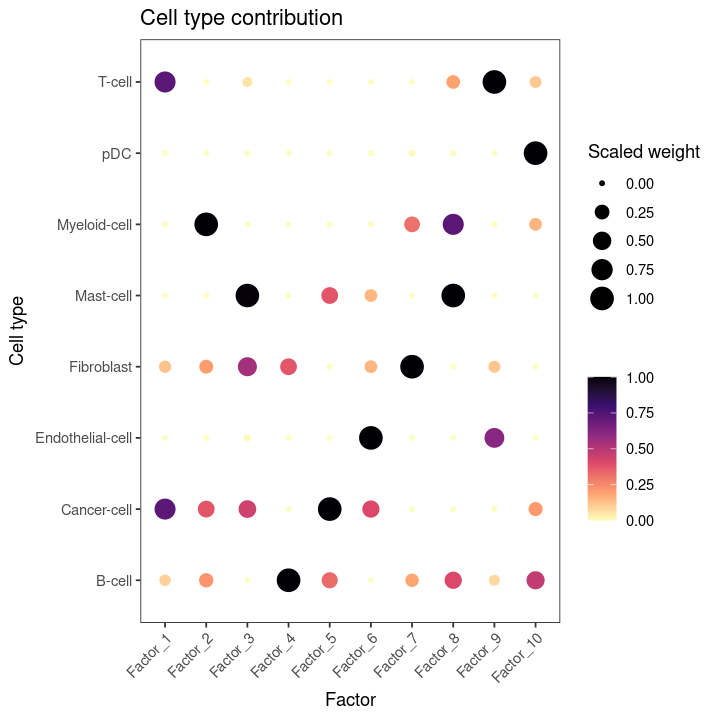

In [58]:


ggplot(nmf_data_h_df, aes(x=Factor, y=Cell, size=Weight, color=Weight)) +
  geom_point() +
  labs(title="Cell type contribution", x="Factor", y = "Cell type",
       color = "", size = "Scaled weight") +
  scale_color_viridis_c(direction = -1, option = "magma") +
  theme_bw() +
  theme(axis.text.x = element_text(angle=45, hjust=1),
        panel.grid = element_blank())